# Preprocess the Datasets

Preprocessing Pipeline for Knee Osteoporosis Detection

We preprocess X-ray images of the knee to improve classification performance for detecting Normal, Osteopenia, and Osteoporosis conditions.

There is two Datasets - 
1. The first without metabolic data will use us for train/validation.
2. The second dataset, with metabolic data, will use us for test.

   
The preprocessing consists of four main steps - 

1.	Removing Duplicates – Identifying and eliminating duplicate images to ensure data integrity - in both dataset. 
2.	Cropping the Knee Joint – Using a YOLO model to focus on the relevant region in the X-ray.
3.	Data Augmentation – Applying transformations to improve model generalization.
4.	X-ray Enhancement – Utilizing contrast enhancement and pseudo-coloring techniques to emphasize bone structures.

Each step produces a new dataset version, maintaining the class structure. 

In [1]:
import os


In [2]:
folder_path = r"C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project"

In [3]:
dataset_path = os.path.join(folder_path, r"data\test_metabolic")
dataset_path = os.path.join(folder_path, r"OS_Collected_Data")
dataset_path


'C:\\Users\\e0l07sq\\Desktop\\rnd\\osteoporosis_project\\OS_Collected_Data'

### First dataset -  Train and validation Dataset Distribution Before Preprocessing


📊 **Dataset Statistics After Before Preprocessing:**
  📂 Normal: 289 images
  📂 Osteopenia: 234 images
  📂 Osteoporosis: 212 images


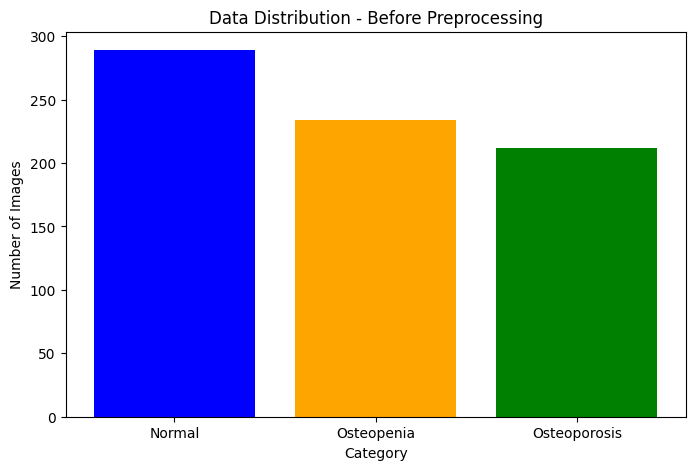

In [4]:
import os
import matplotlib.pyplot as plt

# Define dataset path
# dataset_path = r"C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\OS_Collected_Data"
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Function to print dataset statistics
def dataset_statistics(dataset_path, step_name):
    """Prints the total number of images in each category."""
    print(f"\n📊 **Dataset Statistics After {step_name}:**")
    counts = {}
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        num_images = len(os.listdir(category_path)) if os.path.exists(category_path) else 0
        counts[category] = num_images
        print(f"  📂 {category}: {num_images} images")

    # Plot bar chart
    plt.figure(figsize=(8, 5))
    plt.bar(counts.keys(), counts.values(), color=["blue", "orange", "green"])
    plt.title(f"Data Distribution - {step_name}")
    plt.ylabel("Number of Images")
    plt.xlabel("Category")
    plt.show()

# Show initial dataset distribution
dataset_statistics(dataset_path, "Before Preprocessing")

### Step 1 - Remove Duplicates

Processing Osteoporosis: 100%|██████████| 212/212 [00:02<00:00, 77.02it/s] 



✅ Step 1 Complete: 62 duplicate images removed.

📊 **Dataset Statistics After Step 1 - Duplicate Removal:**
  📂 Normal: 256 images
  📂 Osteopenia: 234 images
  📂 Osteoporosis: 183 images


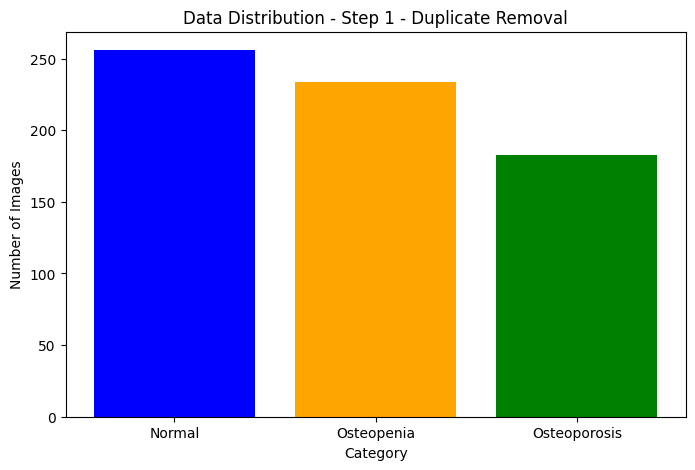

In [5]:
import imagehash
from PIL import Image
import shutil
from collections import defaultdict
from tqdm import tqdm

# Paths

output_path_step1 = os.path.join(dataset_path, "training_validation_datasets\step_1_removed_duplicates")
def analyze_and_remove_duplicates(input_path, output_path):
    """Removes duplicate images using perceptual hashing."""
    hashes = {}
    duplicates_removed = 0

    # Create output directory structure
    for category in categories:
        os.makedirs(os.path.join(output_path, category), exist_ok=True)

    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        for img_name in tqdm(os.listdir(category_path), desc=f"Processing {category}"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
                    shutil.copy(img_path, os.path.join(output_category_path, img_name))
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Step 1 Complete: {duplicates_removed} duplicate images removed.")

# Run Step 1
analyze_and_remove_duplicates(dataset_path, output_path_step1)
dataset_statistics(output_path_step1, "Step 1 - Duplicate Removal")

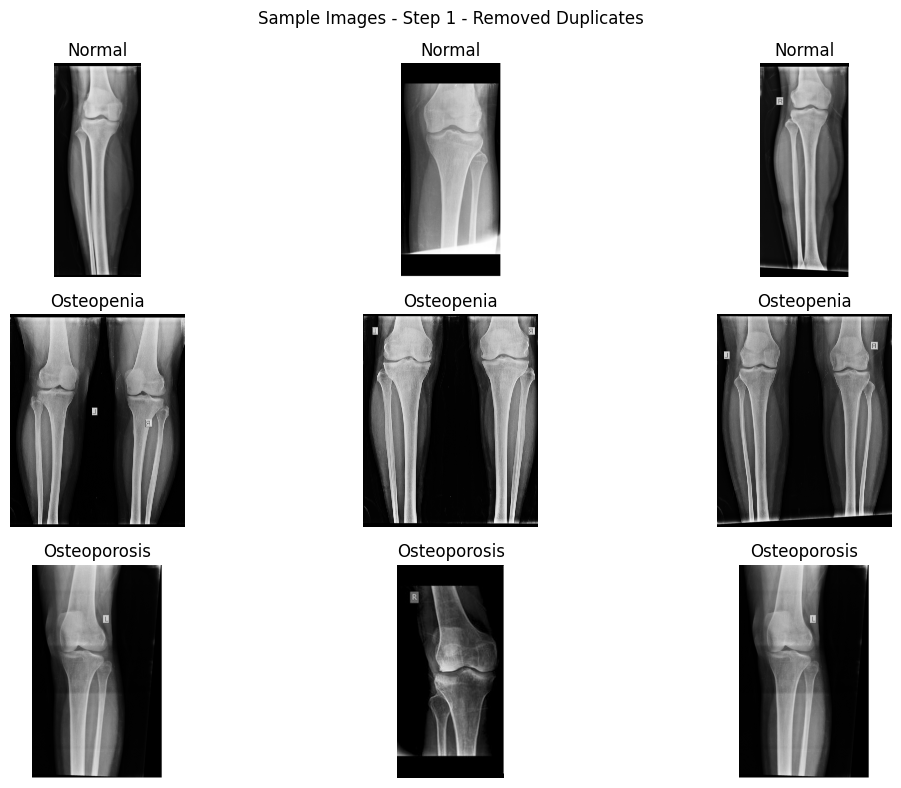

In [6]:
import random
from PIL import Image

def show_sample_images(dataset_path, step_name):
    """Displays 3 sample images from each category."""
    fig, axes = plt.subplots(len(categories), 3, figsize=(12, 8))

    for row, category in enumerate(categories):
        category_path = os.path.join(dataset_path, category)
        images = os.listdir(category_path)

        for col in range(3):
            if images:
                img_path = os.path.join(category_path, random.choice(images))
                img = Image.open(img_path)

                axes[row, col].imshow(img, cmap="gray")
                axes[row, col].axis("off")
                axes[row, col].set_title(f"{category}")

    plt.suptitle(f"Sample Images - {step_name}")
    plt.tight_layout()
    plt.show()

show_sample_images(output_path_step1, "Step 1 - Removed Duplicates")

### Step 2 - Crop Knee Joint Using YOLO

#### Knee Joint Identication

WARNING  Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\yolo\yolo_run\weights\best.onnx for ONNX Runtime inference...
Using ONNX Runtime CUDAExecutionProvider

image 1/1 C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\OS_Collected_Data\training_validation_datasets\step_1_removed_duplicates\Normal\Normal 404.png: 640x640 1 knee, 16.7ms
Speed: 33.6ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\OS_Collected_Data\training_validation_datasets\step_1_removed_duplicates\Normal\Normal 167.png: 640x640 1 knee, 14.3ms
Speed: 0.0ms preprocess, 14.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\OS_Collected_Data\training_validation_datasets\ste

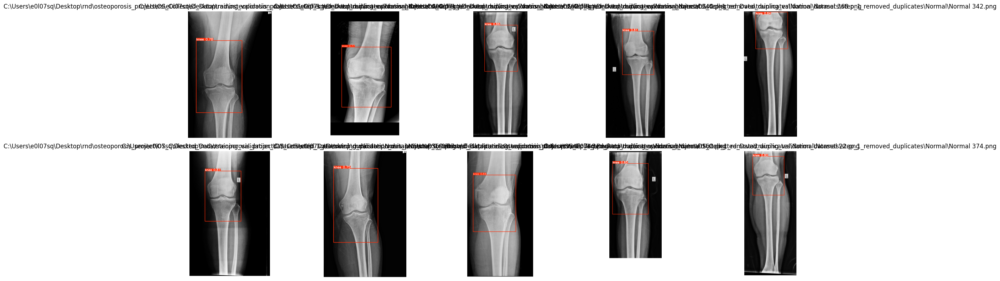

In [7]:
import random
import glob
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image

# Load YOLO model
model_path = os.path.join(folder_path, r"yolo\yolo_run\weights\best.onnx")
model = YOLO(model_path)

# Get all image file paths from Step 1 (after duplicate removal)
image_paths = glob.glob(output_path_step1 + "/*/*.png")  # Adjust for multiple categories

# Ensure there are enough images in the folder
if len(image_paths) == 0:
    print("❌ No images found in the specified folder. Please check the path or file types.")
else:
    # Select 10 random images (or less if there are fewer than 10)
    random_images = random.sample(image_paths, min(10, len(image_paths)))

    # Plot YOLO Predictions
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns for 10 images

    for ax, image_path in zip(axes.flatten(), random_images):
        results = model(image_path)  # Run YOLO on the image
        result_img = results[0].plot()  # Get the annotated image

        ax.imshow(result_img)  # Display the image with bounding boxes
        ax.set_title(image_path.split("/")[-1])  # Show image filename
        ax.axis("off")  # Hide axes

    plt.tight_layout()
    plt.show()

#### Identication and Display All Cropped Knees - 1, 2 knee joints per Xray

In [8]:
import glob
import cv2
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load YOLO model
# model_path = "C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\yolo\yolo_run\weights\best.onnx"
model = YOLO(model_path)

# Path to Osteopenia images from Step 1
osteopenia_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_1_removed_duplicates/Osteopenia"

# Find all images, supporting multiple formats
image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(osteopenia_path, f"*.{ext}")))

# Select up to 5 images
num_images = min(5, len(image_paths))

if num_images == 0:
    print("⚠️ No images found! Check the folder path or file formats.")
else:
    selected_images = image_paths[:num_images]

    # Create figure dynamically
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))  # 3 columns: Original + 2 Crops

    for i, img_path in enumerate(selected_images):
        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Cannot read image: {img_path}")
            continue

        results = model(image)

        # Plot the original image
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {os.path.basename(img_path)}")
        axes[i, 0].axis("off")

        # Extract all detected knees
        cropped_knees = []
        confidences = []
        width_threshold = image.shape[1] // 2  # Half of image width

        for result in results:
            for box in result.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                confidence = box.conf[0].item()

                cropped_knee = image[y1:y2, x1:x2]

                # Store only if valid
                if cropped_knee.size != 0:
                    cropped_knees.append((cropped_knee, confidence, x1, x2))

        # **Filter detections**
        left_knee, right_knee = None, None
        left_conf, right_conf = 0, 0

        for knee, conf, x1, x2 in cropped_knees:
            # Classify as LEFT or RIGHT knee
            if x2 < width_threshold:  # Left side of image
                if conf > left_conf:
                    left_knee, left_conf = knee, conf
            else:  # Right side of image
                if conf > right_conf:
                    right_knee, right_conf = knee, conf

        # Show cropped knees
        if left_knee is not None:
            axes[i, 1].imshow(cv2.cvtColor(left_knee, cv2.COLOR_BGR2RGB))
            axes[i, 1].set_title(f"Cropped Knee 1 (Left)")
            axes[i, 1].axis("off")
        else:
            axes[i, 1].set_title("❌ No Left Knee Detected")
            axes[i, 1].axis("off")

        if right_knee is not None:
            axes[i, 2].imshow(cv2.cvtColor(right_knee, cv2.COLOR_BGR2RGB))
            axes[i, 2].set_title(f"Cropped Knee 2 (Right)")
            axes[i, 2].axis("off")
        else:
            axes[i, 2].set_title("❌ No Right Knee Detected")
            axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

WARNING  Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
⚠️ No images found! Check the folder path or file formats.


#### Cropping the knee joints

In [9]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# Load YOLO model
# model_path = r"C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\yolo\yolo_run\weights\best.onnx"
model = YOLO(model_path)

# Paths
input_path = os.path.join(dataset_path, r"training_validation_datasets\step_1_removed_duplicates")
output_path_step2 = os.path.join(dataset_path, r"training_validation_datasets\step_2_cropped_square_adaptive_knee")

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure output directories exist
for category in categories:
    os.makedirs(os.path.join(output_path_step2, category), exist_ok=True)

def adaptive_centered_square_crop(image, x1, y1, x2, y2, output_size=224):
    """Crop a square around the center of the YOLO box using avg(width, height), then resize to output_size."""
    h, w, _ = image.shape
    x_center = (x1 + x2) // 2
    y_center = (y1 + y2) // 2

    box_w = x2 - x1
    box_h = y2 - y1
    crop_size = int((box_w + box_h) / 2)
    half_crop = crop_size // 2

    x1_crop = max(0, x_center - half_crop)
    y1_crop = max(0, y_center - half_crop)
    x2_crop = min(w, x_center + half_crop)
    y2_crop = min(h, y_center + half_crop)

    cropped = image[y1_crop:y2_crop, x1_crop:x2_crop]

    # Pad if smaller than crop_size (due to borders)
    pad_top = (crop_size - cropped.shape[0]) // 2
    pad_bottom = (crop_size - cropped.shape[0] + 1) // 2
    pad_left = (crop_size - cropped.shape[1]) // 2
    pad_right = (crop_size - cropped.shape[1] + 1) // 2

    padded = cv2.copyMakeBorder(
        cropped,
        pad_top,
        pad_bottom,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=[0, 0, 0],
    )

    # Resize to model input size
    resized = cv2.resize(padded, (output_size, output_size))
    return resized

def crop_and_save_knees(input_path, output_path):
    """Uses YOLO to detect and save square knee crops using avg(w,h) with resize to 224x224."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Get all images
        image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(category_path, f"*.{ext}")))

        print(f"📂 Processing {category} - {len(image_paths)} images")

        for img_path in tqdm(image_paths, desc=f"Cropping {category}"):
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Skipping unreadable image: {img_path}")
                continue

            results = model(image)
            cropped_knees = []
            width_threshold = image.shape[1] // 2

            for result in results:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()

                    cropped = adaptive_centered_square_crop(image, x1, y1, x2, y2)

                    if cropped.size != 0:
                        cropped_knees.append((cropped, confidence, x1, x2))

            # Separate left and right knees
            left_knee, right_knee = None, None
            left_conf, right_conf = 0, 0

            for knee, conf, x1, x2 in cropped_knees:
                if x2 < width_threshold:
                    if conf > left_conf:
                        left_knee, left_conf = knee, conf
                else:
                    if conf > right_conf:
                        right_knee, right_conf = knee, conf

            # Save cropped knees
            base_filename = os.path.basename(img_path)
            filename_no_ext, ext = os.path.splitext(base_filename)

            if left_knee is not None:
                left_output_path = os.path.join(output_category_path, f"{filename_no_ext}_left{ext}")
                cv2.imwrite(left_output_path, left_knee)

            if right_knee is not None:
                right_output_path = os.path.join(output_category_path, f"{filename_no_ext}_right{ext}")
                cv2.imwrite(right_output_path, right_knee)

    print("\n✅ Step 2 Complete: Cropped knees saved with adaptive square logic.")

# Run it
crop_and_save_knees(input_path, output_path_step2)

WARNING  Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
📂 Processing Normal - 256 images


Cropping Normal:   0%|          | 0/256 [00:00<?, ?it/s]

Loading C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\yolo\yolo_run\weights\best.onnx for ONNX Runtime inference...
Using ONNX Runtime CUDAExecutionProvider

0: 640x640 1 knee, 0.0ms
Speed: 2.0ms preprocess, 0.0ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   0%|          | 1/256 [00:02<09:27,  2.23s/it]


0: 640x640 1 knee, 21.0ms
Speed: 0.0ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   2%|▏         | 4/256 [00:02<01:54,  2.21it/s]


0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 16.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   3%|▎         | 7/256 [00:02<00:58,  4.23it/s]


0: 640x640 1 knee, 9.2ms
Speed: 3.0ms preprocess, 9.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   4%|▎         | 9/256 [00:02<00:42,  5.76it/s]


0: 640x640 1 knee, 0.0ms
Speed: 14.9ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   4%|▍         | 11/256 [00:02<00:33,  7.36it/s]


0: 640x640 2 knees, 0.0ms
Speed: 17.4ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   5%|▌         | 13/256 [00:02<00:26,  9.20it/s]


0: 640x640 1 knee, 0.0ms
Speed: 15.2ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   6%|▋         | 16/256 [00:02<00:20, 11.80it/s]


0: 640x640 1 knee, 0.0ms
Speed: 2.2ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   7%|▋         | 18/256 [00:03<00:18, 13.20it/s]


0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 0.7ms preprocess, 0.0ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   8%|▊         | 21/256 [00:03<00:15, 15.22it/s]


0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   9%|▉         | 24/256 [00:03<00:13, 17.74it/s]


0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 16.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  11%|█         | 27/256 [00:03<00:13, 17.25it/s]


0: 640x640 2 knees, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 16.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  11%|█▏        | 29/256 [00:03<00:13, 17.27it/s]


0: 640x640 1 knee, 0.0ms
Speed: 3.5ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.9ms
Speed: 0.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  12%|█▎        | 32/256 [00:03<00:12, 18.54it/s]


0: 640x640 1 knee, 1.5ms
Speed: 16.2ms preprocess, 1.5ms inference, 10.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.0ms
Speed: 15.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  13%|█▎        | 34/256 [00:03<00:12, 18.34it/s]


0: 640x640 1 knee, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  14%|█▍        | 37/256 [00:04<00:11, 19.58it/s]


0: 640x640 1 knee, 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.8ms
Speed: 0.0ms preprocess, 20.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  16%|█▌        | 40/256 [00:04<00:11, 19.02it/s]


0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 16.7ms preprocess, 0.0ms inference, 15.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  17%|█▋        | 43/256 [00:04<00:10, 20.01it/s]


0: 640x640 1 knee, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.5ms
Speed: 16.7ms preprocess, 3.5ms inference, 13.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  18%|█▊        | 46/256 [00:04<00:10, 19.32it/s]


0: 640x640 1 knee, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.8ms
Speed: 0.0ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.4ms
Speed: 0.0ms preprocess, 18.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  19%|█▉        | 49/256 [00:04<00:10, 19.82it/s]


0: 640x640 1 knee, 15.5ms
Speed: 13.3ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.4ms
Speed: 11.5ms preprocess, 1.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  20%|██        | 52/256 [00:04<00:10, 18.95it/s]


0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  21%|██        | 54/256 [00:04<00:10, 19.16it/s]


0: 640x640 1 knee, 14.1ms
Speed: 0.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.8ms
Speed: 0.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  22%|██▏       | 56/256 [00:04<00:10, 19.34it/s]


0: 640x640 1 knee, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.1ms
Speed: 16.2ms preprocess, 2.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  23%|██▎       | 59/256 [00:05<00:09, 20.18it/s]


0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 2.8ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.8ms
Speed: 0.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  24%|██▍       | 62/256 [00:05<00:09, 19.56it/s]


0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.6ms
Speed: 0.0ms preprocess, 12.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  25%|██▌       | 64/256 [00:05<00:09, 19.64it/s]


0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  26%|██▌       | 67/256 [00:05<00:09, 19.72it/s]


0: 640x640 2 knees, 1.0ms
Speed: 15.4ms preprocess, 1.0ms inference, 16.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 4.0ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  27%|██▋       | 69/256 [00:05<00:10, 17.26it/s]


0: 640x640 2 knees, 14.1ms
Speed: 4.0ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.8ms
Speed: 16.1ms preprocess, 15.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  28%|██▊       | 71/256 [00:05<00:12, 15.32it/s]


0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.4ms
Speed: 0.0ms preprocess, 32.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  29%|██▊       | 73/256 [00:06<00:12, 14.75it/s]


0: 640x640 2 knees, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.4ms
Speed: 16.9ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  29%|██▉       | 75/256 [00:06<00:12, 14.69it/s]


0: 640x640 2 knees, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.2ms
Speed: 0.0ms preprocess, 13.2ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  30%|███       | 77/256 [00:06<00:12, 14.90it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 16.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  31%|███       | 79/256 [00:06<00:11, 15.49it/s]


0: 640x640 1 knee, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 16.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  32%|███▏      | 81/256 [00:06<00:10, 15.93it/s]


0: 640x640 1 knee, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 16.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  32%|███▏      | 83/256 [00:06<00:10, 16.27it/s]


0: 640x640 2 knees, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 16.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  33%|███▎      | 85/256 [00:06<00:10, 16.30it/s]


0: 640x640 1 knee, 31.9ms
Speed: 0.0ms preprocess, 31.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.8ms
Speed: 0.0ms preprocess, 14.8ms inference, 16.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  34%|███▍      | 88/256 [00:06<00:09, 17.12it/s]


0: 640x640 1 knee, 31.1ms
Speed: 0.0ms preprocess, 31.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 17.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  35%|███▌      | 90/256 [00:07<00:09, 17.76it/s]


0: 640x640 1 knee, 16.0ms
Speed: 2.3ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  36%|███▋      | 93/256 [00:07<00:09, 17.89it/s]


0: 640x640 1 knee, 16.9ms
Speed: 15.2ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 8.4ms
Speed: 4.0ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  37%|███▋      | 95/256 [00:07<00:09, 17.69it/s]


0: 640x640 1 knee, 14.8ms
Speed: 0.0ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.5ms
Speed: 0.0ms preprocess, 32.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  38%|███▊      | 97/256 [00:07<00:08, 18.23it/s]


0: 640x640 1 knee, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.7ms
Speed: 14.5ms preprocess, 18.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  39%|███▉      | 100/256 [00:07<00:07, 19.61it/s]


0: 640x640 1 knee, 14.1ms
Speed: 3.9ms preprocess, 14.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  40%|████      | 103/256 [00:07<00:06, 22.26it/s]


0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.0ms
Speed: 3.0ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  41%|████▏     | 106/256 [00:07<00:07, 20.63it/s]


0: 640x640 1 knee, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 16.6ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  43%|████▎     | 110/256 [00:07<00:06, 22.59it/s]


0: 640x640 1 knee, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 14.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 16.4ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.5ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  44%|████▍     | 113/256 [00:08<00:06, 23.44it/s]


0: 640x640 2 knees, 19.5ms
Speed: 0.0ms preprocess, 19.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 11.3ms
Speed: 0.0ms preprocess, 11.3ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  45%|████▌     | 116/256 [00:08<00:05, 24.05it/s]


0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.8ms
Speed: 0.0ms preprocess, 31.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 19.8ms
Speed: 0.0ms preprocess, 19.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  46%|████▋     | 119/256 [00:08<00:05, 25.22it/s]


0: 640x640 1 knee, 17.5ms
Speed: 3.0ms preprocess, 17.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 2.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  48%|████▊     | 123/256 [00:08<00:04, 27.09it/s]


0: 640x640 1 knee, 21.4ms
Speed: 0.0ms preprocess, 21.4ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 16.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.5ms
Speed: 16.4ms preprocess, 15.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  49%|████▉     | 126/256 [00:08<00:04, 26.68it/s]


0: 640x640 1 knee, 6.2ms
Speed: 16.0ms preprocess, 6.2ms inference, 10.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 16.6ms preprocess, 16.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  50%|█████     | 129/256 [00:08<00:04, 26.02it/s]


0: 640x640 1 knee, 17.5ms
Speed: 1.0ms preprocess, 17.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  52%|█████▏    | 133/256 [00:08<00:04, 27.59it/s]


0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 15.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  53%|█████▎    | 136/256 [00:08<00:04, 27.12it/s]


0: 640x640 1 knee, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 27.0ms
Speed: 0.0ms preprocess, 27.0ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 17.3ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  54%|█████▍    | 139/256 [00:09<00:04, 25.64it/s]


0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  55%|█████▌    | 142/256 [00:09<00:04, 26.75it/s]


0: 640x640 1 knee, 11.1ms
Speed: 0.0ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.8ms
Speed: 9.4ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  57%|█████▋    | 145/256 [00:09<00:04, 26.03it/s]


0: 640x640 1 knee, 18.2ms
Speed: 0.0ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 15.3ms preprocess, 16.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 15.8ms preprocess, 16.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.0ms
Speed: 2.0ms preprocess, 1.0ms inference, 16.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  58%|█████▊    | 149/256 [00:09<00:03, 27.50it/s]


0: 640x640 1 knee, 14.0ms
Speed: 2.9ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.6ms
Speed: 0.0ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  60%|█████▉    | 153/256 [00:09<00:03, 28.51it/s]


0: 640x640 1 knee, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.9ms
Speed: 6.0ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  61%|██████▏   | 157/256 [00:09<00:03, 27.86it/s]


0: 640x640 1 knee, 16.6ms
Speed: 2.5ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.6ms
Speed: 0.0ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  62%|██████▎   | 160/256 [00:09<00:03, 26.25it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 20.3ms
Speed: 0.0ms preprocess, 20.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  64%|██████▎   | 163/256 [00:09<00:03, 25.14it/s]


0: 640x640 2 knees, 15.9ms
Speed: 1.4ms preprocess, 15.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 16.6ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.8ms
Speed: 0.0ms preprocess, 11.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  65%|██████▍   | 166/256 [00:10<00:03, 23.48it/s]


0: 640x640 2 knees, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 10.2ms
Speed: 4.5ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  66%|██████▌   | 169/256 [00:10<00:03, 22.63it/s]


0: 640x640 2 knees, 5.5ms
Speed: 6.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 24.9ms
Speed: 0.0ms preprocess, 24.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  67%|██████▋   | 172/256 [00:10<00:03, 22.36it/s]


0: 640x640 2 knees, 18.2ms
Speed: 0.0ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  68%|██████▊   | 175/256 [00:10<00:03, 23.16it/s]


0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 2.1ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  70%|██████▉   | 178/256 [00:10<00:03, 23.85it/s]


0: 640x640 1 knee, 14.4ms
Speed: 0.0ms preprocess, 14.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.6ms
Speed: 15.5ms preprocess, 1.6ms inference, 16.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  71%|███████   | 181/256 [00:10<00:03, 24.38it/s]


0: 640x640 1 knee, 16.3ms
Speed: 1.6ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  72%|███████▏  | 184/256 [00:10<00:02, 24.78it/s]


0: 640x640 1 knee, 15.0ms
Speed: 2.8ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 28.4ms
Speed: 0.0ms preprocess, 28.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 0.8ms preprocess, 16.9ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  73%|███████▎  | 187/256 [00:11<00:03, 20.74it/s]


0: 640x640 1 knee, 15.8ms
Speed: 0.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.3ms
Speed: 16.0ms preprocess, 1.3ms inference, 16.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 22.2ms
Speed: 0.0ms preprocess, 22.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  74%|███████▍  | 190/256 [00:11<00:03, 21.38it/s]


0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 16.3ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  75%|███████▌  | 193/256 [00:11<00:03, 20.79it/s]


0: 640x640 1 knee, 26.6ms
Speed: 0.0ms preprocess, 26.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  77%|███████▋  | 196/256 [00:11<00:02, 21.36it/s]


0: 640x640 1 knee, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 3.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 26.4ms
Speed: 0.0ms preprocess, 26.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  78%|███████▊  | 199/256 [00:11<00:02, 22.40it/s]


0: 640x640 1 knee, 14.7ms
Speed: 3.6ms preprocess, 14.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 16.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  79%|███████▉  | 202/256 [00:11<00:02, 23.26it/s]


0: 640x640 1 knee, 28.4ms
Speed: 0.0ms preprocess, 28.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  80%|████████  | 205/256 [00:11<00:02, 18.74it/s]


0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.3ms
Speed: 9.5ms preprocess, 9.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  81%|████████▏ | 208/256 [00:12<00:03, 15.61it/s]


0: 640x640 1 knee, 21.1ms
Speed: 0.7ms preprocess, 21.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 16.3ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  82%|████████▏ | 210/256 [00:12<00:03, 15.04it/s]


0: 640x640 1 knee, 35.4ms
Speed: 0.0ms preprocess, 35.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 0.0ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  83%|████████▎ | 212/256 [00:12<00:03, 12.92it/s]


0: 640x640 1 knee, 46.2ms
Speed: 0.0ms preprocess, 46.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.2ms
Speed: 16.8ms preprocess, 38.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  84%|████████▎ | 214/256 [00:12<00:03, 11.59it/s]


0: 640x640 1 knee, 47.3ms
Speed: 0.0ms preprocess, 47.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 44.5ms
Speed: 0.0ms preprocess, 44.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  84%|████████▍ | 216/256 [00:13<00:03, 11.06it/s]


0: 640x640 1 knee, 45.3ms
Speed: 0.0ms preprocess, 45.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.4ms
Speed: 0.0ms preprocess, 42.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  85%|████████▌ | 218/256 [00:13<00:03, 10.49it/s]


0: 640x640 1 knee, 25.4ms
Speed: 4.0ms preprocess, 25.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.6ms
Speed: 0.0ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  86%|████████▌ | 220/256 [00:13<00:03,  9.86it/s]


0: 640x640 1 knee, 34.5ms
Speed: 16.1ms preprocess, 34.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 29.6ms
Speed: 5.0ms preprocess, 29.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  87%|████████▋ | 222/256 [00:13<00:03,  9.71it/s]


0: 640x640 1 knee, 33.9ms
Speed: 0.6ms preprocess, 33.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  87%|████████▋ | 223/256 [00:13<00:03,  9.72it/s]


0: 640x640 1 knee, 33.5ms
Speed: 0.0ms preprocess, 33.5ms inference, 7.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.3ms
Speed: 16.1ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  88%|████████▊ | 225/256 [00:13<00:03,  9.69it/s]


0: 640x640 1 knee, 40.3ms
Speed: 0.0ms preprocess, 40.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  88%|████████▊ | 226/256 [00:14<00:03,  9.55it/s]


0: 640x640 1 knee, 41.1ms
Speed: 3.1ms preprocess, 41.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▊ | 227/256 [00:14<00:03,  9.64it/s]


0: 640x640 1 knee, 39.3ms
Speed: 16.4ms preprocess, 39.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▉ | 228/256 [00:14<00:02,  9.46it/s]


0: 640x640 1 knee, 51.5ms
Speed: 0.0ms preprocess, 51.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 41.3ms
Speed: 0.0ms preprocess, 41.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  90%|████████▉ | 230/256 [00:14<00:02,  9.62it/s]


0: 640x640 1 knee, 41.3ms
Speed: 0.0ms preprocess, 41.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  90%|█████████ | 231/256 [00:14<00:02,  9.69it/s]


0: 640x640 1 knee, 38.6ms
Speed: 6.0ms preprocess, 38.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  91%|█████████ | 232/256 [00:14<00:02,  9.70it/s]


0: 640x640 1 knee, 43.1ms
Speed: 0.0ms preprocess, 43.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.9ms
Speed: 0.0ms preprocess, 42.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  91%|█████████▏| 234/256 [00:14<00:02,  9.87it/s]


0: 640x640 2 knees, 40.3ms
Speed: 0.0ms preprocess, 40.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.8ms
Speed: 0.0ms preprocess, 42.8ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  92%|█████████▏| 236/256 [00:15<00:01, 10.26it/s]


0: 640x640 1 knee, 34.5ms
Speed: 16.1ms preprocess, 34.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 4.0ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  93%|█████████▎| 238/256 [00:15<00:01, 10.76it/s]


0: 640x640 1 knee, 36.5ms
Speed: 4.0ms preprocess, 36.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  94%|█████████▍| 240/256 [00:15<00:01, 10.50it/s]


0: 640x640 1 knee, 36.6ms
Speed: 4.0ms preprocess, 36.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 28.5ms
Speed: 4.0ms preprocess, 28.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  95%|█████████▍| 242/256 [00:15<00:01, 10.63it/s]


0: 640x640 1 knee, 30.0ms
Speed: 4.0ms preprocess, 30.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 29.7ms
Speed: 4.0ms preprocess, 29.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  95%|█████████▌| 244/256 [00:15<00:01, 10.43it/s]


0: 640x640 1 knee, 33.5ms
Speed: 9.7ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 67.2ms
Speed: 9.4ms preprocess, 67.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  96%|█████████▌| 246/256 [00:16<00:00, 10.01it/s]


0: 640x640 1 knee, 66.3ms
Speed: 3.9ms preprocess, 66.3ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.1ms
Speed: 0.0ms preprocess, 40.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  97%|█████████▋| 248/256 [00:16<00:00,  9.52it/s]


0: 640x640 1 knee, 43.7ms
Speed: 0.0ms preprocess, 43.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  97%|█████████▋| 249/256 [00:16<00:00,  9.33it/s]


0: 640x640 1 knee, 37.1ms
Speed: 15.8ms preprocess, 37.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.4ms
Speed: 16.7ms preprocess, 36.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  98%|█████████▊| 251/256 [00:16<00:00,  9.61it/s]


0: 640x640 1 knee, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 15.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.7ms
Speed: 0.0ms preprocess, 33.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  99%|█████████▉| 253/256 [00:16<00:00, 10.20it/s]


0: 640x640 1 knee, 28.1ms
Speed: 4.0ms preprocess, 28.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|█████████▉| 255/256 [00:16<00:00, 10.14it/s]


0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|██████████| 256/256 [00:17<00:00, 15.03it/s]

📂 Processing Osteopenia - 234 images



Cropping Osteopenia:   0%|          | 0/234 [00:00<?, ?it/s]


0: 640x640 2 knees, 18.9ms
Speed: 16.1ms preprocess, 18.9ms inference, 15.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   0%|          | 1/234 [00:00<00:29,  8.02it/s]


0: 640x640 2 knees, 33.2ms
Speed: 4.0ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   1%|          | 2/234 [00:00<00:35,  6.56it/s]


0: 640x640 2 knees, 36.9ms
Speed: 0.5ms preprocess, 36.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   1%|▏         | 3/234 [00:00<00:35,  6.53it/s]


0: 640x640 2 knees, 34.9ms
Speed: 0.0ms preprocess, 34.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 4/234 [00:00<00:34,  6.58it/s]


0: 640x640 2 knees, 27.2ms
Speed: 7.0ms preprocess, 27.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 5/234 [00:00<00:36,  6.35it/s]


0: 640x640 2 knees, 33.1ms
Speed: 16.9ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 6/234 [00:00<00:37,  6.02it/s]


0: 640x640 2 knees, 33.7ms
Speed: 16.5ms preprocess, 33.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 7/234 [00:01<00:36,  6.22it/s]


0: 640x640 2 knees, 66.8ms
Speed: 0.0ms preprocess, 66.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 8/234 [00:01<00:37,  5.95it/s]


0: 640x640 2 knees, 67.2ms
Speed: 1.4ms preprocess, 67.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 9/234 [00:01<00:40,  5.62it/s]


0: 640x640 2 knees, 66.6ms
Speed: 16.6ms preprocess, 66.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 10/234 [00:01<00:41,  5.41it/s]


0: 640x640 2 knees, 67.2ms
Speed: 0.0ms preprocess, 67.2ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   5%|▍         | 11/234 [00:01<00:42,  5.26it/s]


0: 640x640 2 knees, 67.5ms
Speed: 15.5ms preprocess, 67.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   5%|▌         | 12/234 [00:02<00:41,  5.33it/s]


0: 640x640 2 knees, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 13/234 [00:02<00:42,  5.23it/s]


0: 640x640 2 knees, 66.1ms
Speed: 15.7ms preprocess, 66.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 14/234 [00:02<00:42,  5.15it/s]


0: 640x640 2 knees, 66.8ms
Speed: 5.2ms preprocess, 66.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▋         | 15/234 [00:02<00:40,  5.38it/s]


0: 640x640 2 knees, 66.7ms
Speed: 16.1ms preprocess, 66.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   7%|▋         | 16/234 [00:02<00:41,  5.27it/s]


0: 640x640 2 knees, 65.6ms
Speed: 7.0ms preprocess, 65.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   7%|▋         | 17/234 [00:03<00:40,  5.31it/s]


0: 640x640 2 knees, 66.8ms
Speed: 0.0ms preprocess, 66.8ms inference, 16.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 18/234 [00:03<00:40,  5.36it/s]


0: 640x640 2 knees, 66.7ms
Speed: 16.6ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 19/234 [00:03<00:39,  5.38it/s]


0: 640x640 2 knees, 67.7ms
Speed: 6.0ms preprocess, 67.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▊         | 20/234 [00:03<00:40,  5.26it/s]


0: 640x640 1 knee, 58.3ms
Speed: 16.7ms preprocess, 58.3ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▉         | 21/234 [00:03<00:37,  5.61it/s]


0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▉         | 22/234 [00:03<00:35,  6.05it/s]


0: 640x640 2 knees, 40.8ms
Speed: 0.0ms preprocess, 40.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|▉         | 23/234 [00:04<00:33,  6.24it/s]


0: 640x640 2 knees, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|█         | 24/234 [00:04<00:31,  6.57it/s]


0: 640x640 1 knee, 25.0ms
Speed: 8.5ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  11%|█         | 25/234 [00:04<00:29,  7.06it/s]


0: 640x640 1 knee, 34.6ms
Speed: 0.0ms preprocess, 34.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  11%|█         | 26/234 [00:04<00:27,  7.45it/s]


0: 640x640 1 knee, 34.0ms
Speed: 1.7ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 27/234 [00:04<00:27,  7.47it/s]


0: 640x640 1 knee, 33.9ms
Speed: 17.1ms preprocess, 33.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 28/234 [00:04<00:26,  7.78it/s]


0: 640x640 1 knee, 35.3ms
Speed: 0.0ms preprocess, 35.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 29/234 [00:04<00:25,  7.99it/s]


0: 640x640 2 knees, 34.1ms
Speed: 6.5ms preprocess, 34.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  13%|█▎        | 30/234 [00:04<00:26,  7.83it/s]


0: 640x640 1 knee, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  13%|█▎        | 31/234 [00:05<00:25,  8.04it/s]


0: 640x640 2 knees, 34.2ms
Speed: 6.0ms preprocess, 34.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▎        | 32/234 [00:05<00:25,  7.87it/s]


0: 640x640 2 knees, 24.6ms
Speed: 0.0ms preprocess, 24.6ms inference, 15.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▍        | 33/234 [00:05<00:26,  7.50it/s]


0: 640x640 1 knee, 49.4ms
Speed: 0.0ms preprocess, 49.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▍        | 34/234 [00:05<00:26,  7.46it/s]


0: 640x640 1 knee, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▍        | 35/234 [00:05<00:25,  7.76it/s]


0: 640x640 2 knees, 83.3ms
Speed: 0.0ms preprocess, 83.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▌        | 36/234 [00:05<00:27,  7.13it/s]


0: 640x640 1 knee, 55.0ms
Speed: 6.0ms preprocess, 55.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▌        | 37/234 [00:05<00:28,  6.99it/s]


0: 640x640 1 knee, 62.8ms
Speed: 8.0ms preprocess, 62.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▌        | 38/234 [00:06<00:29,  6.72it/s]


0: 640x640 1 knee, 46.7ms
Speed: 6.3ms preprocess, 46.7ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  17%|█▋        | 39/234 [00:06<00:28,  6.87it/s]


0: 640x640 1 knee, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  17%|█▋        | 40/234 [00:06<00:28,  6.81it/s]


0: 640x640 2 knees, 33.6ms
Speed: 0.5ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 41/234 [00:06<00:27,  7.00it/s]


0: 640x640 2 knees, 25.1ms
Speed: 9.0ms preprocess, 25.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 42/234 [00:06<00:27,  6.98it/s]


0: 640x640 2 knees, 34.1ms
Speed: 15.8ms preprocess, 34.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 43/234 [00:06<00:26,  7.29it/s]


0: 640x640 2 knees, 33.5ms
Speed: 0.0ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  19%|█▉        | 44/234 [00:06<00:26,  7.09it/s]


0: 640x640 1 knee, 46.1ms
Speed: 0.0ms preprocess, 46.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  19%|█▉        | 45/234 [00:06<00:26,  7.21it/s]


0: 640x640 1 knee, 32.1ms
Speed: 18.0ms preprocess, 32.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|█▉        | 46/234 [00:07<00:24,  7.57it/s]


0: 640x640 2 knees, 41.0ms
Speed: 0.0ms preprocess, 41.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|██        | 47/234 [00:07<00:24,  7.55it/s]


0: 640x640 1 knee, 33.7ms
Speed: 0.0ms preprocess, 33.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██        | 48/234 [00:07<00:24,  7.47it/s]


0: 640x640 2 knees, 40.9ms
Speed: 0.0ms preprocess, 40.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██        | 49/234 [00:07<00:23,  7.84it/s]


0: 640x640 1 knee, 34.5ms
Speed: 15.6ms preprocess, 34.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██▏       | 50/234 [00:07<00:23,  7.74it/s]


0: 640x640 1 knee, 28.1ms
Speed: 6.0ms preprocess, 28.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 51/234 [00:07<00:23,  7.95it/s]


0: 640x640 1 knee, 25.7ms
Speed: 8.5ms preprocess, 25.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 52/234 [00:07<00:23,  7.62it/s]


0: 640x640 1 knee, 75.4ms
Speed: 0.0ms preprocess, 75.4ms inference, 8.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  23%|██▎       | 53/234 [00:08<00:25,  7.21it/s]


0: 640x640 2 knees, 83.1ms
Speed: 0.0ms preprocess, 83.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  23%|██▎       | 54/234 [00:08<00:26,  6.77it/s]


0: 640x640 2 knees, 80.5ms
Speed: 0.0ms preprocess, 80.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▎       | 55/234 [00:08<00:29,  6.14it/s]


0: 640x640 1 knee, 52.8ms
Speed: 6.0ms preprocess, 52.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 56/234 [00:08<00:28,  6.29it/s]


0: 640x640 1 knee, 24.4ms
Speed: 9.0ms preprocess, 24.4ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 57/234 [00:08<00:26,  6.68it/s]


0: 640x640 2 knees, 35.8ms
Speed: 4.0ms preprocess, 35.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  25%|██▍       | 58/234 [00:08<00:24,  7.05it/s]


0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  25%|██▌       | 59/234 [00:08<00:24,  7.20it/s]


0: 640x640 2 knees, 33.2ms
Speed: 16.4ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▌       | 60/234 [00:09<00:23,  7.55it/s]


0: 640x640 1 knee, 25.8ms
Speed: 0.0ms preprocess, 25.8ms inference, 14.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▌       | 61/234 [00:09<00:22,  7.67it/s]


0: 640x640 2 knees, 34.0ms
Speed: 16.9ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▋       | 62/234 [00:09<00:22,  7.69it/s]


0: 640x640 1 knee, 24.3ms
Speed: 5.0ms preprocess, 24.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  27%|██▋       | 63/234 [00:09<00:21,  8.03it/s]


0: 640x640 1 knee, 34.5ms
Speed: 15.0ms preprocess, 34.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  27%|██▋       | 64/234 [00:09<00:20,  8.17it/s]


0: 640x640 1 knee, 25.1ms
Speed: 9.5ms preprocess, 25.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 65/234 [00:09<00:21,  7.79it/s]


0: 640x640 2 knees, 43.7ms
Speed: 0.0ms preprocess, 43.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 66/234 [00:09<00:22,  7.61it/s]


0: 640x640 1 knee, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▊       | 67/234 [00:09<00:22,  7.54it/s]


0: 640x640 2 knees, 24.6ms
Speed: 9.5ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▉       | 68/234 [00:10<00:21,  7.82it/s]


0: 640x640 1 knee, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▉       | 69/234 [00:10<00:21,  7.73it/s]


0: 640x640 2 knees, 34.3ms
Speed: 0.0ms preprocess, 34.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|██▉       | 70/234 [00:10<00:21,  7.77it/s]


0: 640x640 1 knee, 66.4ms
Speed: 0.0ms preprocess, 66.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|███       | 71/234 [00:10<00:22,  7.29it/s]


0: 640x640 1 knee, 67.4ms
Speed: 16.4ms preprocess, 67.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  31%|███       | 72/234 [00:10<00:22,  7.09it/s]


0: 640x640 2 knees, 57.0ms
Speed: 9.5ms preprocess, 57.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  31%|███       | 73/234 [00:10<00:24,  6.52it/s]


0: 640x640 2 knees, 66.7ms
Speed: 7.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 74/234 [00:11<00:26,  5.96it/s]


0: 640x640 1 knee, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 75/234 [00:11<00:26,  5.97it/s]


0: 640x640 1 knee, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 76/234 [00:11<00:26,  5.98it/s]


0: 640x640 2 knees, 21.3ms
Speed: 4.5ms preprocess, 21.3ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  33%|███▎      | 77/234 [00:11<00:24,  6.36it/s]


0: 640x640 2 knees, 33.9ms
Speed: 0.0ms preprocess, 33.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  33%|███▎      | 78/234 [00:11<00:24,  6.45it/s]


0: 640x640 2 knees, 34.0ms
Speed: 0.0ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▍      | 79/234 [00:11<00:23,  6.51it/s]


0: 640x640 2 knees, 43.5ms
Speed: 0.0ms preprocess, 43.5ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▍      | 80/234 [00:11<00:24,  6.33it/s]


0: 640x640 2 knees, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▍      | 81/234 [00:12<00:23,  6.44it/s]


0: 640x640 2 knees, 34.0ms
Speed: 1.4ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▌      | 82/234 [00:12<00:24,  6.30it/s]


0: 640x640 2 knees, 31.5ms
Speed: 0.0ms preprocess, 31.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▌      | 83/234 [00:12<00:23,  6.41it/s]


0: 640x640 2 knees, 48.7ms
Speed: 0.0ms preprocess, 48.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▌      | 84/234 [00:12<00:23,  6.26it/s]


0: 640x640 1 knee, 33.7ms
Speed: 0.0ms preprocess, 33.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▋      | 85/234 [00:12<00:24,  6.20it/s]


0: 640x640 2 knees, 33.6ms
Speed: 16.8ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  37%|███▋      | 86/234 [00:12<00:24,  6.13it/s]


0: 640x640 2 knees, 22.1ms
Speed: 4.5ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  37%|███▋      | 87/234 [00:13<00:23,  6.28it/s]


0: 640x640 2 knees, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 88/234 [00:13<00:25,  5.84it/s]


0: 640x640 2 knees, 66.4ms
Speed: 1.8ms preprocess, 66.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 89/234 [00:13<00:26,  5.41it/s]


0: 640x640 2 knees, 66.9ms
Speed: 0.0ms preprocess, 66.9ms inference, 16.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 90/234 [00:13<00:26,  5.42it/s]


0: 640x640 1 knee, 66.5ms
Speed: 0.0ms preprocess, 66.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  39%|███▉      | 91/234 [00:13<00:26,  5.43it/s]


0: 640x640 2 knees, 66.5ms
Speed: 0.0ms preprocess, 66.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  39%|███▉      | 92/234 [00:14<00:25,  5.49it/s]


0: 640x640 2 knees, 66.4ms
Speed: 0.0ms preprocess, 66.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|███▉      | 93/234 [00:14<00:25,  5.58it/s]


0: 640x640 2 knees, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 16.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|████      | 94/234 [00:14<00:25,  5.39it/s]


0: 640x640 2 knees, 76.3ms
Speed: 0.0ms preprocess, 76.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████      | 95/234 [00:14<00:26,  5.32it/s]


0: 640x640 2 knees, 59.8ms
Speed: 6.0ms preprocess, 59.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████      | 96/234 [00:14<00:26,  5.30it/s]


0: 640x640 2 knees, 66.5ms
Speed: 0.0ms preprocess, 66.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████▏     | 97/234 [00:14<00:25,  5.34it/s]


0: 640x640 2 knees, 66.2ms
Speed: 17.1ms preprocess, 66.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 98/234 [00:15<00:25,  5.24it/s]


0: 640x640 2 knees, 66.8ms
Speed: 0.0ms preprocess, 66.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 99/234 [00:15<00:26,  5.16it/s]


0: 640x640 2 knees, 67.1ms
Speed: 16.3ms preprocess, 67.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  43%|████▎     | 100/234 [00:15<00:26,  4.98it/s]


0: 640x640 2 knees, 66.7ms
Speed: 0.0ms preprocess, 66.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  43%|████▎     | 101/234 [00:15<00:25,  5.12it/s]


0: 640x640 2 knees, 66.8ms
Speed: 15.5ms preprocess, 66.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▎     | 102/234 [00:15<00:25,  5.10it/s]


0: 640x640 2 knees, 66.6ms
Speed: 16.3ms preprocess, 66.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▍     | 103/234 [00:16<00:25,  5.18it/s]


0: 640x640 1 knee, 82.0ms
Speed: 0.0ms preprocess, 82.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.8ms
Speed: 0.0ms preprocess, 49.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  45%|████▍     | 105/234 [00:16<00:19,  6.66it/s]


0: 640x640 1 knee, 48.7ms
Speed: 0.0ms preprocess, 48.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 38.9ms
Speed: 17.3ms preprocess, 38.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  46%|████▌     | 107/234 [00:16<00:15,  8.10it/s]


0: 640x640 1 knee, 31.9ms
Speed: 18.4ms preprocess, 31.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  47%|████▋     | 109/234 [00:16<00:12,  9.70it/s]


0: 640x640 1 knee, 28.8ms
Speed: 5.0ms preprocess, 28.8ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 40.8ms
Speed: 0.0ms preprocess, 40.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  47%|████▋     | 111/234 [00:16<00:11, 10.37it/s]


0: 640x640 1 knee, 32.6ms
Speed: 16.6ms preprocess, 32.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.0ms
Speed: 0.0ms preprocess, 33.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  48%|████▊     | 113/234 [00:16<00:11, 10.86it/s]


0: 640x640 1 knee, 19.7ms
Speed: 4.0ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 27.2ms
Speed: 5.4ms preprocess, 27.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  49%|████▉     | 115/234 [00:17<00:10, 11.64it/s]


0: 640x640 1 knee, 37.9ms
Speed: 0.0ms preprocess, 37.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.1ms
Speed: 4.0ms preprocess, 23.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  50%|█████     | 117/234 [00:17<00:09, 12.01it/s]


0: 640x640 1 knee, 32.7ms
Speed: 4.6ms preprocess, 32.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.3ms
Speed: 0.5ms preprocess, 34.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  51%|█████     | 119/234 [00:17<00:09, 12.49it/s]


0: 640x640 2 knees, 42.1ms
Speed: 0.0ms preprocess, 42.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.0ms
Speed: 16.7ms preprocess, 34.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  52%|█████▏    | 121/234 [00:17<00:08, 12.61it/s]


0: 640x640 1 knee, 31.5ms
Speed: 0.0ms preprocess, 31.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.5ms
Speed: 5.0ms preprocess, 31.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  53%|█████▎    | 123/234 [00:17<00:08, 12.52it/s]


0: 640x640 1 knee, 31.2ms
Speed: 5.0ms preprocess, 31.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.5ms
Speed: 1.9ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  53%|█████▎    | 125/234 [00:17<00:08, 13.07it/s]


0: 640x640 1 knee, 1.8ms
Speed: 15.0ms preprocess, 1.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 23.6ms
Speed: 0.0ms preprocess, 23.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  54%|█████▍    | 127/234 [00:18<00:07, 13.61it/s]


0: 640x640 2 knees, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.2ms
Speed: 6.0ms preprocess, 3.2ms inference, 12.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  55%|█████▌    | 129/234 [00:18<00:07, 14.52it/s]


0: 640x640 1 knee, 14.8ms
Speed: 0.7ms preprocess, 14.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  56%|█████▌    | 131/234 [00:18<00:06, 15.81it/s]


0: 640x640 1 knee, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  57%|█████▋    | 133/234 [00:18<00:06, 16.19it/s]


0: 640x640 1 knee, 20.9ms
Speed: 0.0ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  58%|█████▊    | 135/234 [00:18<00:06, 16.45it/s]


0: 640x640 3 knees, 1.6ms
Speed: 3.4ms preprocess, 1.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  59%|█████▊    | 137/234 [00:18<00:06, 15.85it/s]


0: 640x640 2 knees, 0.0ms
Speed: 3.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 0.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  59%|█████▉    | 139/234 [00:18<00:05, 16.85it/s]


0: 640x640 1 knee, 0.0ms
Speed: 3.4ms preprocess, 0.0ms inference, 15.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 15.7ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.0ms
Speed: 4.5ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  61%|██████    | 142/234 [00:18<00:05, 17.91it/s]


0: 640x640 1 knee, 12.0ms
Speed: 18.2ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  62%|██████▏   | 144/234 [00:18<00:05, 17.25it/s]


0: 640x640 1 knee, 4.5ms
Speed: 4.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  62%|██████▏   | 146/234 [00:19<00:05, 16.78it/s]


0: 640x640 2 knees, 0.0ms
Speed: 0.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  63%|██████▎   | 148/234 [00:19<00:05, 16.01it/s]


0: 640x640 2 knees, 3.3ms
Speed: 3.0ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 17.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  64%|██████▍   | 150/234 [00:19<00:05, 14.84it/s]


0: 640x640 2 knees, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  65%|██████▍   | 152/234 [00:19<00:05, 14.64it/s]


0: 640x640 2 knees, 13.0ms
Speed: 16.2ms preprocess, 13.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  66%|██████▌   | 154/234 [00:19<00:05, 13.94it/s]


0: 640x640 2 knees, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.0ms
Speed: 15.8ms preprocess, 33.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  67%|██████▋   | 156/234 [00:19<00:06, 12.68it/s]


0: 640x640 2 knees, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.0ms
Speed: 0.0ms preprocess, 32.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  68%|██████▊   | 158/234 [00:20<00:06, 12.49it/s]


0: 640x640 2 knees, 16.7ms
Speed: 0.5ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 28.7ms
Speed: 0.0ms preprocess, 28.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  68%|██████▊   | 160/234 [00:20<00:05, 12.34it/s]


0: 640x640 2 knees, 31.5ms
Speed: 0.0ms preprocess, 31.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 28.7ms
Speed: 0.0ms preprocess, 28.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  69%|██████▉   | 162/234 [00:20<00:05, 12.22it/s]


0: 640x640 2 knees, 16.7ms
Speed: 0.4ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.4ms
Speed: 2.3ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  70%|███████   | 164/234 [00:20<00:05, 11.80it/s]


0: 640x640 2 knees, 34.3ms
Speed: 0.0ms preprocess, 34.3ms inference, 16.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.5ms
Speed: 16.8ms preprocess, 36.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  71%|███████   | 166/234 [00:20<00:06, 10.36it/s]


0: 640x640 2 knees, 33.9ms
Speed: 0.0ms preprocess, 33.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.3ms
Speed: 5.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  72%|███████▏  | 168/234 [00:21<00:06, 10.77it/s]


0: 640x640 2 knees, 34.2ms
Speed: 0.0ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 41.0ms
Speed: 0.0ms preprocess, 41.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  73%|███████▎  | 170/234 [00:21<00:06,  9.99it/s]


0: 640x640 2 knees, 48.1ms
Speed: 0.0ms preprocess, 48.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 50.8ms
Speed: 0.0ms preprocess, 50.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  74%|███████▎  | 172/234 [00:21<00:06,  9.61it/s]


0: 640x640 2 knees, 27.7ms
Speed: 4.0ms preprocess, 27.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  74%|███████▍  | 173/234 [00:21<00:06,  9.57it/s]


0: 640x640 2 knees, 32.6ms
Speed: 17.4ms preprocess, 32.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.8ms
Speed: 0.0ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  75%|███████▍  | 175/234 [00:21<00:06,  9.45it/s]


0: 640x640 2 knees, 34.9ms
Speed: 0.0ms preprocess, 34.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 39.3ms
Speed: 2.0ms preprocess, 39.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  76%|███████▌  | 177/234 [00:21<00:05,  9.62it/s]


0: 640x640 2 knees, 35.8ms
Speed: 4.0ms preprocess, 35.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 25.4ms
Speed: 4.9ms preprocess, 25.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  76%|███████▋  | 179/234 [00:22<00:05, 10.00it/s]


0: 640x640 2 knees, 49.5ms
Speed: 0.0ms preprocess, 49.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.5ms
Speed: 17.4ms preprocess, 32.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  77%|███████▋  | 181/234 [00:22<00:05, 10.26it/s]


0: 640x640 2 knees, 28.3ms
Speed: 5.1ms preprocess, 28.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 48.4ms
Speed: 0.0ms preprocess, 48.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  78%|███████▊  | 183/234 [00:22<00:05, 10.18it/s]


0: 640x640 2 knees, 35.1ms
Speed: 0.0ms preprocess, 35.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.6ms
Speed: 0.0ms preprocess, 31.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  79%|███████▉  | 185/234 [00:22<00:04, 10.12it/s]


0: 640x640 2 knees, 32.6ms
Speed: 17.3ms preprocess, 32.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.6ms
Speed: 17.5ms preprocess, 32.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  80%|███████▉  | 187/234 [00:22<00:04, 10.08it/s]


0: 640x640 2 knees, 37.0ms
Speed: 5.0ms preprocess, 37.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.3ms
Speed: 6.0ms preprocess, 35.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  81%|████████  | 189/234 [00:23<00:04,  9.80it/s]


0: 640x640 2 knees, 49.2ms
Speed: 0.0ms preprocess, 49.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.1ms
Speed: 0.0ms preprocess, 48.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  82%|████████▏ | 191/234 [00:23<00:04, 10.37it/s]


0: 640x640 2 knees, 41.0ms
Speed: 0.8ms preprocess, 41.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.8ms
Speed: 15.5ms preprocess, 34.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  82%|████████▏ | 193/234 [00:23<00:03, 10.81it/s]


0: 640x640 1 knee, 46.4ms
Speed: 0.0ms preprocess, 46.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.4ms
Speed: 5.5ms preprocess, 34.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  83%|████████▎ | 195/234 [00:23<00:03, 11.15it/s]


0: 640x640 2 knees, 26.7ms
Speed: 5.0ms preprocess, 26.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.6ms
Speed: 16.2ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  84%|████████▍ | 197/234 [00:23<00:03, 11.38it/s]


0: 640x640 2 knees, 32.5ms
Speed: 17.5ms preprocess, 32.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 32.8ms
Speed: 17.3ms preprocess, 32.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  85%|████████▌ | 199/234 [00:24<00:02, 11.91it/s]


0: 640x640 2 knees, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.0ms
Speed: 0.0ms preprocess, 46.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  86%|████████▌ | 201/234 [00:24<00:02, 12.59it/s]


0: 640x640 2 knees, 32.9ms
Speed: 0.0ms preprocess, 32.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  87%|████████▋ | 203/234 [00:24<00:02, 13.80it/s]


0: 640x640 2 knees, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 16.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.1ms
Speed: 0.0ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  88%|████████▊ | 205/234 [00:24<00:02, 13.65it/s]


0: 640x640 2 knees, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.8ms
Speed: 16.7ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  88%|████████▊ | 207/234 [00:24<00:01, 14.52it/s]


0: 640x640 2 knees, 18.2ms
Speed: 0.0ms preprocess, 18.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 4.5ms preprocess, 0.0ms inference, 15.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  90%|████████▉ | 210/234 [00:24<00:01, 16.11it/s]


0: 640x640 2 knees, 9.1ms
Speed: 3.0ms preprocess, 9.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  91%|█████████ | 213/234 [00:24<00:01, 18.12it/s]


0: 640x640 2 knees, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  92%|█████████▏| 215/234 [00:24<00:01, 18.56it/s]


0: 640x640 2 knees, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 16.4ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  93%|█████████▎| 217/234 [00:25<00:00, 18.16it/s]


0: 640x640 2 knees, 14.2ms
Speed: 1.1ms preprocess, 14.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.6ms
Speed: 0.0ms preprocess, 14.6ms inference, 8.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  94%|█████████▍| 220/234 [00:25<00:00, 19.16it/s]


0: 640x640 2 knees, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  95%|█████████▌| 223/234 [00:25<00:00, 19.79it/s]


0: 640x640 2 knees, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  96%|█████████▌| 225/234 [00:25<00:00, 19.84it/s]


0: 640x640 2 knees, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  97%|█████████▋| 228/234 [00:25<00:00, 20.75it/s]


0: 640x640 2 knees, 15.5ms
Speed: 0.5ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 16.5ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  99%|█████████▊| 231/234 [00:25<00:00, 21.21it/s]


0: 640x640 2 knees, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia: 100%|██████████| 234/234 [00:25<00:00,  9.07it/s]


📂 Processing Osteoporosis - 183 images


Cropping Osteoporosis:   0%|          | 0/183 [00:00<?, ?it/s]


0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   1%|          | 2/183 [00:00<00:10, 17.13it/s]


0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   2%|▏         | 4/183 [00:00<00:10, 17.14it/s]


0: 640x640 1 knee, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   4%|▍         | 7/183 [00:00<00:08, 19.75it/s]


0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.5ms
Speed: 4.0ms preprocess, 11.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   5%|▌         | 10/183 [00:00<00:08, 19.85it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   7%|▋         | 12/183 [00:00<00:09, 18.96it/s]


0: 640x640 1 knee, 15.8ms
Speed: 1.5ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   8%|▊         | 14/183 [00:00<00:09, 18.38it/s]


0: 640x640 2 knees, 16.8ms
Speed: 13.7ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   9%|▊         | 16/183 [00:00<00:09, 17.22it/s]


0: 640x640 1 knee, 15.7ms
Speed: 1.4ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 27.9ms
Speed: 0.0ms preprocess, 27.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  10%|▉         | 18/183 [00:01<00:09, 17.11it/s]


0: 640x640 1 knee, 11.0ms
Speed: 0.0ms preprocess, 11.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  11%|█▏        | 21/183 [00:01<00:08, 18.21it/s]


0: 640x640 1 knee, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  13%|█▎        | 23/183 [00:01<00:08, 18.66it/s]


0: 640x640 2 knees, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 15.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  14%|█▎        | 25/183 [00:01<00:08, 18.20it/s]


0: 640x640 1 knee, 15.8ms
Speed: 15.7ms preprocess, 15.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 28.7ms
Speed: 0.0ms preprocess, 28.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  15%|█▍        | 27/183 [00:01<00:09, 17.13it/s]


0: 640x640 1 knee, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  16%|█▋        | 30/183 [00:01<00:08, 18.86it/s]


0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  17%|█▋        | 32/183 [00:01<00:08, 18.37it/s]


0: 640x640 2 knees, 16.8ms
Speed: 15.3ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  19%|█▊        | 34/183 [00:01<00:09, 16.08it/s]


0: 640x640 2 knees, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  20%|█▉        | 36/183 [00:02<00:09, 15.23it/s]


0: 640x640 2 knees, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.5ms
Speed: 16.5ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  21%|██        | 38/183 [00:02<00:09, 15.07it/s]


0: 640x640 2 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 16.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.8ms
Speed: 16.5ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  22%|██▏       | 40/183 [00:02<00:09, 14.52it/s]


0: 640x640 2 knees, 17.9ms
Speed: 0.0ms preprocess, 17.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  23%|██▎       | 42/183 [00:02<00:10, 13.23it/s]


0: 640x640 2 knees, 33.1ms
Speed: 16.4ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 46.3ms
Speed: 0.0ms preprocess, 46.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  24%|██▍       | 44/183 [00:03<00:30,  4.58it/s]


0: 640x640 3 knees, 48.7ms
Speed: 0.0ms preprocess, 48.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 33.6ms
Speed: 0.0ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  25%|██▌       | 46/183 [00:03<00:24,  5.53it/s]


0: 640x640 2 knees, 33.8ms
Speed: 4.2ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 27.6ms
Speed: 4.0ms preprocess, 27.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  26%|██▌       | 48/183 [00:04<00:20,  6.48it/s]


0: 640x640 1 knee, 49.3ms
Speed: 0.0ms preprocess, 49.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.0ms
Speed: 16.6ms preprocess, 37.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  27%|██▋       | 50/183 [00:04<00:17,  7.72it/s]


0: 640x640 1 knee, 32.4ms
Speed: 4.0ms preprocess, 32.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.0ms
Speed: 0.0ms preprocess, 42.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  28%|██▊       | 52/183 [00:04<00:14,  9.15it/s]


0: 640x640 1 knee, 31.9ms
Speed: 3.3ms preprocess, 31.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 29.6ms
Speed: 20.3ms preprocess, 29.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  30%|██▉       | 54/183 [00:04<00:12, 10.63it/s]


0: 640x640 1 knee, 34.0ms
Speed: 17.3ms preprocess, 34.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.3ms
Speed: 0.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  31%|███       | 56/183 [00:04<00:10, 11.67it/s]


0: 640x640 1 knee, 33.6ms
Speed: 16.7ms preprocess, 33.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  32%|███▏      | 58/183 [00:04<00:09, 13.30it/s]


0: 640x640 1 knee, 33.2ms
Speed: 15.7ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  33%|███▎      | 60/183 [00:04<00:08, 14.78it/s]


0: 640x640 (no detections), 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 0.0ms
Speed: 2.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 16.6ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  35%|███▍      | 64/183 [00:04<00:05, 20.04it/s]


0: 640x640 1 knee, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  37%|███▋      | 67/183 [00:04<00:05, 22.51it/s]


0: 640x640 1 knee, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  38%|███▊      | 70/183 [00:05<00:04, 24.47it/s]


0: 640x640 1 knee, 8.2ms
Speed: 4.0ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.6ms
Speed: 0.0ms preprocess, 21.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  40%|███▉      | 73/183 [00:05<00:04, 24.16it/s]


0: 640x640 1 knee, 11.1ms
Speed: 13.4ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 5.5ms
Speed: 3.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  42%|████▏     | 76/183 [00:05<00:04, 25.43it/s]


0: 640x640 1 knee, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 1.4ms preprocess, 0.0ms inference, 16.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.6ms
Speed: 2.0ms preprocess, 10.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  43%|████▎     | 79/183 [00:05<00:03, 26.54it/s]


0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 15.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 14.6ms
Speed: 0.0ms preprocess, 14.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.2ms
Speed: 3.7ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  45%|████▍     | 82/183 [00:05<00:03, 27.46it/s]


0: 640x640 1 knee, 15.0ms
Speed: 18.2ms preprocess, 15.0ms inference, 15.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 16.3ms preprocess, 17.0ms inference, 14.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.1ms
Speed: 16.5ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  46%|████▋     | 85/183 [00:05<00:05, 19.42it/s]


0: 640x640 1 knee, 21.0ms
Speed: 6.0ms preprocess, 21.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 29.9ms
Speed: 0.0ms preprocess, 29.9ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 16.9ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  48%|████▊     | 88/183 [00:05<00:05, 16.91it/s]


0: 640x640 1 knee, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.2ms
Speed: 0.0ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.3ms
Speed: 5.0ms preprocess, 10.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  50%|████▉     | 91/183 [00:06<00:05, 15.56it/s]


0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  51%|█████     | 93/183 [00:06<00:05, 15.88it/s]


0: 640x640 1 knee, 28.0ms
Speed: 0.7ms preprocess, 28.0ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 16.3ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  52%|█████▏    | 95/183 [00:06<00:05, 14.91it/s]


0: 640x640 1 knee, 15.8ms
Speed: 15.4ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 24.7ms
Speed: 0.0ms preprocess, 24.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  53%|█████▎    | 97/183 [00:06<00:05, 15.81it/s]


0: 640x640 1 knee, 1.8ms
Speed: 16.0ms preprocess, 1.8ms inference, 15.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.2ms
Speed: 1.1ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.9ms
Speed: 2.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  55%|█████▍    | 100/183 [00:06<00:04, 18.92it/s]


0: 640x640 1 knee, 15.6ms
Speed: 17.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.3ms
Speed: 17.0ms preprocess, 15.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.0ms
Speed: 3.0ms preprocess, 2.0ms inference, 16.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  56%|█████▋    | 103/183 [00:06<00:04, 19.27it/s]


0: 640x640 1 knee, 14.9ms
Speed: 3.2ms preprocess, 14.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.1ms
Speed: 0.0ms preprocess, 1.1ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  58%|█████▊    | 106/183 [00:06<00:03, 20.95it/s]


0: 640x640 1 knee, 13.9ms
Speed: 3.1ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  60%|█████▉    | 109/183 [00:07<00:03, 22.07it/s]


0: 640x640 1 knee, 15.4ms
Speed: 0.0ms preprocess, 15.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.0ms
Speed: 3.0ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  61%|██████    | 112/183 [00:07<00:03, 22.39it/s]


0: 640x640 1 knee, 17.4ms
Speed: 16.8ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 22.3ms
Speed: 0.0ms preprocess, 22.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.5ms
Speed: 0.0ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  63%|██████▎   | 115/183 [00:07<00:02, 23.24it/s]


0: 640x640 2 knees, 28.4ms
Speed: 0.0ms preprocess, 28.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.8ms
Speed: 1.7ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  64%|██████▍   | 118/183 [00:07<00:02, 24.02it/s]


0: 640x640 1 knee, 13.7ms
Speed: 3.5ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 15.6ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 24.9ms
Speed: 0.0ms preprocess, 24.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  66%|██████▌   | 121/183 [00:07<00:02, 22.56it/s]


0: 640x640 2 knees, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 6.9ms
Speed: 4.0ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 17.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  68%|██████▊   | 124/183 [00:07<00:02, 20.98it/s]


0: 640x640 2 knees, 24.1ms
Speed: 0.0ms preprocess, 24.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 17.0ms
Speed: 15.5ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  69%|██████▉   | 127/183 [00:07<00:02, 19.25it/s]


0: 640x640 1 knee, 16.6ms
Speed: 14.5ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 14.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 15.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  71%|███████   | 130/183 [00:08<00:02, 19.40it/s]


0: 640x640 1 knee, 16.7ms
Speed: 14.2ms preprocess, 16.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 9.4ms preprocess, 15.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  72%|███████▏  | 132/183 [00:08<00:02, 17.14it/s]


0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 3.0ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  73%|███████▎  | 134/183 [00:08<00:03, 15.69it/s]


0: 640x640 1 knee, 15.8ms
Speed: 0.0ms preprocess, 15.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.8ms
Speed: 11.4ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  74%|███████▍  | 136/183 [00:08<00:03, 12.83it/s]


0: 640x640 1 knee, 36.3ms
Speed: 15.5ms preprocess, 36.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 42.0ms
Speed: 0.0ms preprocess, 42.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  75%|███████▌  | 138/183 [00:08<00:04, 10.76it/s]


0: 640x640 1 knee, 35.5ms
Speed: 1.2ms preprocess, 35.5ms inference, 14.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 48.7ms
Speed: 0.0ms preprocess, 48.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  77%|███████▋  | 140/183 [00:09<00:04,  9.03it/s]


0: 640x640 1 knee, 50.1ms
Speed: 0.0ms preprocess, 50.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.3ms
Speed: 15.3ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  78%|███████▊  | 142/183 [00:09<00:04,  8.53it/s]


0: 640x640 1 knee, 36.8ms
Speed: 13.7ms preprocess, 36.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  78%|███████▊  | 143/183 [00:09<00:04,  8.53it/s]


0: 640x640 1 knee, 48.9ms
Speed: 0.0ms preprocess, 48.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  79%|███████▊  | 144/183 [00:09<00:04,  8.55it/s]


0: 640x640 1 knee, 50.3ms
Speed: 0.0ms preprocess, 50.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  79%|███████▉  | 145/183 [00:09<00:04,  8.51it/s]


0: 640x640 1 knee, 35.0ms
Speed: 16.5ms preprocess, 35.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  80%|███████▉  | 146/183 [00:09<00:04,  8.81it/s]


0: 640x640 2 knees, 52.2ms
Speed: 0.0ms preprocess, 52.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  80%|████████  | 147/183 [00:10<00:04,  8.80it/s]


0: 640x640 1 knee, 36.4ms
Speed: 1.2ms preprocess, 36.4ms inference, 13.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  81%|████████  | 148/183 [00:10<00:03,  9.08it/s]


0: 640x640 1 knee, 35.7ms
Speed: 15.3ms preprocess, 35.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.5ms
Speed: 18.1ms preprocess, 31.5ms inference, 16.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  82%|████████▏ | 150/183 [00:10<00:03,  9.75it/s]


0: 640x640 1 knee, 52.0ms
Speed: 0.0ms preprocess, 52.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  83%|████████▎ | 151/183 [00:10<00:03,  9.48it/s]


0: 640x640 1 knee, 33.4ms
Speed: 7.1ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  83%|████████▎ | 152/183 [00:10<00:03,  9.26it/s]


0: 640x640 1 knee, 33.5ms
Speed: 0.0ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 49.0ms
Speed: 0.0ms preprocess, 49.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  84%|████████▍ | 154/183 [00:10<00:02, 11.01it/s]


0: 640x640 1 knee, 32.7ms
Speed: 0.0ms preprocess, 32.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.4ms
Speed: 0.0ms preprocess, 32.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  85%|████████▌ | 156/183 [00:10<00:02, 12.23it/s]


0: 640x640 1 knee, 49.6ms
Speed: 0.0ms preprocess, 49.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.9ms
Speed: 0.0ms preprocess, 32.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  86%|████████▋ | 158/183 [00:10<00:01, 13.07it/s]


0: 640x640 1 knee, 35.6ms
Speed: 0.8ms preprocess, 35.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.6ms
Speed: 3.2ms preprocess, 32.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  87%|████████▋ | 160/183 [00:11<00:01, 14.18it/s]


0: 640x640 1 knee, 32.9ms
Speed: 0.0ms preprocess, 32.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 16.8ms preprocess, 33.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  89%|████████▊ | 162/183 [00:11<00:01, 13.82it/s]


0: 640x640 1 knee, 18.0ms
Speed: 15.5ms preprocess, 18.0ms inference, 16.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.2ms
Speed: 16.3ms preprocess, 32.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  90%|████████▉ | 164/183 [00:11<00:01, 14.26it/s]


0: 640x640 1 knee, 33.1ms
Speed: 16.6ms preprocess, 33.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 16.7ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  91%|█████████ | 166/183 [00:11<00:01, 13.38it/s]


0: 640x640 1 knee, 35.6ms
Speed: 0.0ms preprocess, 35.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.5ms
Speed: 0.0ms preprocess, 33.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  92%|█████████▏| 168/183 [00:11<00:01, 12.58it/s]


0: 640x640 1 knee, 30.3ms
Speed: 0.0ms preprocess, 30.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.4ms
Speed: 0.0ms preprocess, 36.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  93%|█████████▎| 170/183 [00:11<00:00, 13.59it/s]


0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 0.0ms preprocess, 33.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  94%|█████████▍| 172/183 [00:12<00:00, 12.73it/s]


0: 640x640 1 knee, 34.2ms
Speed: 0.0ms preprocess, 34.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.0ms
Speed: 2.1ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  95%|█████████▌| 174/183 [00:12<00:00, 13.33it/s]


0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  96%|█████████▌| 176/183 [00:12<00:00, 14.82it/s]


0: 640x640 1 knee, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.4ms
Speed: 0.0ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  97%|█████████▋| 178/183 [00:12<00:00, 16.07it/s]


0: 640x640 1 knee, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.8ms
Speed: 0.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.4ms
Speed: 0.0ms preprocess, 23.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  99%|█████████▉| 181/183 [00:12<00:00, 17.57it/s]


0: 640x640 2 knees, 1.2ms
Speed: 16.3ms preprocess, 1.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis: 100%|██████████| 183/183 [00:12<00:00, 14.53it/s]


✅ Step 2 Complete: Cropped knees saved with adaptive square logic.


# new image joint

In [ ]:
import glob
import cv2
import os
from tqdm import tqdm
from ultralytics import YOLO

# Load YOLO model
model = YOLO(model_path)

# Paths
input_path = os.path.join(dataset_path, r"training_validation_datasets\step_1_removed_duplicates")
output_path_step5 = os.path.join(dataset_path, r"training_validation_datasets\step_6_cropped_only_both")

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure output directories exist
for category in categories:
    os.makedirs(os.path.join(output_path_step5, category), exist_ok=True)

def adaptive_centered_square_crop(image, x1, y1, x2, y2, output_size=224):
    """Crop a square around the center of the YOLO box using avg(width, height), then resize to output_size."""
    h, w, _ = image.shape
    x_center = (x1 + x2) // 2
    y_center = (y1 + y2) // 2

    box_w = x2 - x1
    box_h = y2 - y1
    crop_size = int((box_w + box_h) / 2)
    half_crop = crop_size // 2

    x1_crop = max(0, x_center - half_crop)
    y1_crop = max(0, y_center - half_crop)
    x2_crop = min(w, x_center + half_crop)
    y2_crop = min(h, y_center + half_crop)

    cropped = image[y1_crop:y2_crop, x1_crop:x2_crop]

    # Pad if smaller than crop_size (due to borders)
    pad_top = (crop_size - cropped.shape[0]) // 2
    pad_bottom = (crop_size - cropped.shape[0] + 1) // 2
    pad_left = (crop_size - cropped.shape[1]) // 2
    pad_right = (crop_size - cropped.shape[1] + 1) // 2

    padded = cv2.copyMakeBorder(
        cropped,
        pad_top,
        pad_bottom,
        pad_left,
        pad_right,
        borderType=cv2.BORDER_CONSTANT,
        value=[0, 0, 0],
    )

    # Resize to model input size
    resized = cv2.resize(padded, (output_size, output_size))
    return resized

def crop_and_save_knees(input_path, output_path):
    """Uses YOLO to detect and save square knee crops using avg(w,h) with resize to 224x224."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Get all images
        image_extensions = ["jpg", "jpeg", "png", "bmp", "tiff"]
        image_paths = []
        for ext in image_extensions:
            image_paths.extend(glob.glob(os.path.join(category_path, f"*.{ext}")))

        print(f"📂 Processing {category} - {len(image_paths)} images")

        for img_path in tqdm(image_paths, desc=f"Cropping {category}"):
            image = cv2.imread(img_path)
            if image is None:
                print(f"⚠️ Skipping unreadable image: {img_path}")
                continue

            results = model(image)
            cropped_knees = []
            width_threshold = image.shape[1] // 2

            for result in results:
                for box in result.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    confidence = box.conf[0].item()

                    cropped = adaptive_centered_square_crop(image, x1, y1, x2, y2)

                    if cropped.size != 0:
                        cropped_knees.append((cropped, confidence, x1, x2))

            # Separate left and right knees
            left_knee, right_knee = None, None
            left_conf, right_conf = 0, 0

            for knee, conf, x1, x2 in cropped_knees:
                if x2 < width_threshold:
                    if conf > left_conf:
                        left_knee, left_conf = knee, conf
                else:
                    if conf > right_conf:
                        right_knee, right_conf = knee, conf

            # Save cropped knees
            base_filename = os.path.basename(img_path)
            filename_no_ext, ext = os.path.splitext(base_filename)
            if left_knee is not None and right_knee is not None:
                # Concatenate side-by-side (left, right)
                both_knees = cv2.hconcat([left_knee, right_knee])
                both_output_path = os.path.join(output_category_path, f"{filename_no_ext}_both{ext}")
                cv2.imwrite(both_output_path, both_knees)
            else:
                if left_knee is not None:
                    left_knee = cv2.flip(left_knee,1)
                    both_knees = cv2.hconcat([left_knee, left_knee])
                    both_output_path = os.path.join(output_category_path, f"{filename_no_ext}_left{ext}")
                    cv2.imwrite(both_output_path, both_knees)


                if right_knee is not None:
                    left_knee = cv2.flip(right_knee,1)
                    both_knees = cv2.hconcat([right_knee, right_knee])
                    both_output_path = os.path.join(output_category_path, f"{filename_no_ext}_right{ext}")
                    cv2.imwrite(both_output_path, both_knees)

    print("\n✅ Step 2 Complete: Cropped knees saved with adaptive square logic.")

# Run it
crop_and_save_knees(input_path, output_path_step5)

WARNING  Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
📂 Processing Normal - 256 images


Cropping Normal:   0%|          | 0/256 [00:00<?, ?it/s]

Loading C:\Users\e0l07sq\Desktop\rnd\osteoporosis_project\yolo\yolo_run\weights\best.onnx for ONNX Runtime inference...
Using ONNX Runtime CUDAExecutionProvider

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   0%|          | 1/256 [00:02<09:13,  2.17s/it]


0: 640x640 1 knee, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.1ms
Speed: 0.0ms preprocess, 15.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.3ms
Speed: 14.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   2%|▏         | 5/256 [00:02<01:28,  2.84it/s]


0: 640x640 1 knee, 0.0ms
Speed: 14.8ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.1ms
Speed: 4.0ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   3%|▎         | 8/256 [00:02<00:50,  4.94it/s]


0: 640x640 1 knee, 2.5ms
Speed: 17.9ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.8ms
Speed: 0.7ms preprocess, 11.8ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   4%|▍         | 11/256 [00:02<00:33,  7.35it/s]


0: 640x640 2 knees, 6.3ms
Speed: 2.7ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   5%|▌         | 14/256 [00:02<00:24,  9.94it/s]


0: 640x640 1 knee, 1.4ms
Speed: 16.3ms preprocess, 1.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.7ms
Speed: 2.0ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.2ms
Speed: 15.5ms preprocess, 1.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   7%|▋         | 17/256 [00:02<00:18, 12.58it/s]


0: 640x640 1 knee, 22.2ms
Speed: 0.0ms preprocess, 22.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.9ms
Speed: 3.0ms preprocess, 1.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 14.4ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   8%|▊         | 20/256 [00:02<00:15, 15.18it/s]


0: 640x640 1 knee, 14.0ms
Speed: 4.5ms preprocess, 14.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.2ms
Speed: 3.0ms preprocess, 7.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 16.7ms preprocess, 0.0ms inference, 9.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:   9%|▉         | 23/256 [00:03<00:13, 17.45it/s]


0: 640x640 1 knee, 0.0ms
Speed: 0.0ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  10%|█         | 26/256 [00:03<00:12, 18.71it/s]


0: 640x640 1 knee, 10.0ms
Speed: 3.0ms preprocess, 10.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 14.4ms preprocess, 0.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.5ms
Speed: 4.0ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  11%|█▏        | 29/256 [00:03<00:11, 19.82it/s]


0: 640x640 1 knee, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.8ms
Speed: 0.0ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.9ms
Speed: 14.2ms preprocess, 0.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  12%|█▎        | 32/256 [00:03<00:10, 21.39it/s]


0: 640x640 1 knee, 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 8.2ms
Speed: 3.0ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  14%|█▎        | 35/256 [00:03<00:09, 23.33it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.2ms
Speed: 0.0ms preprocess, 13.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  15%|█▍        | 38/256 [00:03<00:09, 23.83it/s]


0: 640x640 1 knee, 3.2ms
Speed: 15.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.5ms
Speed: 3.0ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  16%|█▌        | 41/256 [00:03<00:08, 24.50it/s]


0: 640x640 1 knee, 20.5ms
Speed: 0.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.1ms
Speed: 0.0ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  17%|█▋        | 44/256 [00:03<00:08, 24.87it/s]


0: 640x640 1 knee, 0.0ms
Speed: 1.9ms preprocess, 0.0ms inference, 13.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.8ms
Speed: 0.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  18%|█▊        | 47/256 [00:03<00:08, 23.29it/s]


0: 640x640 1 knee, 1.4ms
Speed: 3.0ms preprocess, 1.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.3ms
Speed: 4.0ms preprocess, 7.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  20%|█▉        | 50/256 [00:04<00:08, 24.86it/s]


0: 640x640 1 knee, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.0ms
Speed: 15.6ms preprocess, 11.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.0ms
Speed: 3.1ms preprocess, 13.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  21%|██        | 53/256 [00:04<00:08, 24.55it/s]


0: 640x640 1 knee, 4.9ms
Speed: 3.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.8ms
Speed: 12.0ms preprocess, 1.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.5ms
Speed: 16.6ms preprocess, 13.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  22%|██▏       | 56/256 [00:04<00:07, 25.41it/s]


0: 640x640 1 knee, 4.8ms
Speed: 5.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.7ms
Speed: 12.9ms preprocess, 4.7ms inference, 12.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.2ms
Speed: 0.0ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  23%|██▎       | 59/256 [00:04<00:08, 23.49it/s]


0: 640x640 1 knee, 13.8ms
Speed: 1.5ms preprocess, 13.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.6ms
Speed: 3.0ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  24%|██▍       | 62/256 [00:04<00:08, 24.14it/s]


0: 640x640 1 knee, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.9ms
Speed: 2.0ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  25%|██▌       | 65/256 [00:04<00:07, 24.47it/s]


0: 640x640 1 knee, 21.4ms
Speed: 0.0ms preprocess, 21.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.4ms
Speed: 3.1ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.8ms
Speed: 1.8ms preprocess, 14.8ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  27%|██▋       | 68/256 [00:04<00:08, 23.33it/s]


0: 640x640 2 knees, 20.6ms
Speed: 0.0ms preprocess, 20.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.1ms
Speed: 0.0ms preprocess, 13.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  28%|██▊       | 71/256 [00:05<00:09, 20.36it/s]


0: 640x640 2 knees, 9.5ms
Speed: 3.0ms preprocess, 9.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.8ms
Speed: 1.7ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 6.5ms
Speed: 6.0ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  29%|██▉       | 74/256 [00:05<00:09, 19.00it/s]


0: 640x640 1 knee, 9.3ms
Speed: 2.0ms preprocess, 9.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.0ms
Speed: 2.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.8ms
Speed: 15.9ms preprocess, 0.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  30%|███       | 77/256 [00:05<00:08, 19.91it/s]


0: 640x640 1 knee, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.3ms
Speed: 0.0ms preprocess, 15.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  31%|███▏      | 80/256 [00:05<00:08, 20.65it/s]


0: 640x640 1 knee, 16.9ms
Speed: 4.0ms preprocess, 16.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.0ms
Speed: 3.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  32%|███▏      | 83/256 [00:05<00:08, 21.10it/s]


0: 640x640 2 knees, 13.4ms
Speed: 3.2ms preprocess, 13.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.9ms
Speed: 2.0ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.4ms
Speed: 0.0ms preprocess, 19.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  34%|███▎      | 86/256 [00:05<00:08, 20.84it/s]


0: 640x640 1 knee, 17.1ms
Speed: 0.0ms preprocess, 17.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.7ms
Speed: 0.0ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  35%|███▍      | 89/256 [00:05<00:07, 21.28it/s]


0: 640x640 1 knee, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 4.6ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.6ms
Speed: 3.5ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  36%|███▌      | 92/256 [00:06<00:07, 22.48it/s]


0: 640x640 1 knee, 2.7ms
Speed: 13.3ms preprocess, 2.7ms inference, 12.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.8ms
Speed: 16.6ms preprocess, 1.8ms inference, 12.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  37%|███▋      | 95/256 [00:06<00:07, 21.63it/s]


0: 640x640 1 knee, 11.4ms
Speed: 5.0ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.9ms
Speed: 3.0ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  38%|███▊      | 98/256 [00:06<00:06, 22.76it/s]


0: 640x640 1 knee, 16.8ms
Speed: 4.0ms preprocess, 16.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.0ms
Speed: 2.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  40%|███▉      | 102/256 [00:06<00:05, 25.91it/s]


0: 640x640 1 knee, 12.9ms
Speed: 3.0ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.1ms
Speed: 0.5ms preprocess, 14.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  42%|████▏     | 107/256 [00:06<00:04, 30.60it/s]


0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 14.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 3.3ms preprocess, 16.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 3.1ms preprocess, 0.0ms inference, 16.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  43%|████▎     | 111/256 [00:06<00:04, 31.38it/s]


0: 640x640 1 knee, 12.3ms
Speed: 4.0ms preprocess, 12.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.3ms
Speed: 1.3ms preprocess, 14.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 20.7ms
Speed: 0.0ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  45%|████▌     | 116/256 [00:06<00:04, 34.99it/s]


0: 640x640 1 knee, 2.5ms
Speed: 14.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 14.0ms
Speed: 4.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.0ms
Speed: 3.0ms preprocess, 13.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  47%|████▋     | 120/256 [00:06<00:03, 35.24it/s]


0: 640x640 1 knee, 12.0ms
Speed: 2.0ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.2ms
Speed: 2.0ms preprocess, 12.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.9ms
Speed: 0.0ms preprocess, 10.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 16.8ms preprocess, 0.0ms inference, 14.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 2.3ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  49%|████▉     | 125/256 [00:07<00:03, 35.61it/s]


0: 640x640 1 knee, 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.1ms
Speed: 5.4ms preprocess, 11.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 8.4ms
Speed: 5.0ms preprocess, 8.4ms inference, 11.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.9ms
Speed: 4.9ms preprocess, 20.9ms inference, 10.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  50%|█████     | 129/256 [00:07<00:04, 30.52it/s]


0: 640x640 1 knee, 37.2ms
Speed: 0.0ms preprocess, 37.2ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.3ms
Speed: 0.0ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 16.0ms preprocess, 16.7ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  52%|█████▏    | 133/256 [00:07<00:04, 29.09it/s]


0: 640x640 1 knee, 27.5ms
Speed: 0.0ms preprocess, 27.5ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 25.2ms
Speed: 6.0ms preprocess, 25.2ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 22.9ms
Speed: 4.0ms preprocess, 22.9ms inference, 7.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.3ms
Speed: 5.0ms preprocess, 20.3ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  54%|█████▎    | 137/256 [00:07<00:04, 26.27it/s]


0: 640x640 1 knee, 22.7ms
Speed: 6.0ms preprocess, 22.7ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.9ms
Speed: 2.6ms preprocess, 14.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  55%|█████▍    | 140/256 [00:07<00:04, 26.67it/s]


0: 640x640 1 knee, 0.0ms
Speed: 2.7ms preprocess, 0.0ms inference, 14.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.3ms
Speed: 6.0ms preprocess, 15.3ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.5ms
Speed: 6.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  56%|█████▌    | 143/256 [00:07<00:04, 27.18it/s]


0: 640x640 1 knee, 34.9ms
Speed: 0.0ms preprocess, 34.9ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 30.0ms
Speed: 0.0ms preprocess, 30.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.2ms
Speed: 3.9ms preprocess, 20.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  57%|█████▋    | 146/256 [00:07<00:04, 25.65it/s]


0: 640x640 1 knee, 27.0ms
Speed: 6.0ms preprocess, 27.0ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.7ms
Speed: 8.0ms preprocess, 20.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  58%|█████▊    | 149/256 [00:07<00:04, 25.63it/s]


0: 640x640 1 knee, 14.0ms
Speed: 0.7ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.9ms
Speed: 2.0ms preprocess, 9.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.2ms
Speed: 0.0ms preprocess, 23.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.6ms
Speed: 14.2ms preprocess, 7.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  60%|██████    | 154/256 [00:08<00:03, 29.26it/s]


0: 640x640 1 knee, 18.6ms
Speed: 14.5ms preprocess, 18.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.0ms
Speed: 9.5ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  62%|██████▏   | 158/256 [00:08<00:03, 29.69it/s]


0: 640x640 1 knee, 16.9ms
Speed: 0.0ms preprocess, 16.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.0ms
Speed: 5.0ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.5ms
Speed: 0.0ms preprocess, 17.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 19.7ms
Speed: 0.0ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  63%|██████▎   | 162/256 [00:08<00:02, 31.84it/s]


0: 640x640 2 knees, 17.7ms
Speed: 0.0ms preprocess, 17.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 5.3ms
Speed: 3.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 23.7ms
Speed: 0.0ms preprocess, 23.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  65%|██████▍   | 166/256 [00:08<00:02, 31.50it/s]


0: 640x640 2 knees, 11.9ms
Speed: 3.0ms preprocess, 11.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.0ms
Speed: 5.0ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 2.2ms
Speed: 13.9ms preprocess, 2.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 21.6ms
Speed: 0.0ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  66%|██████▋   | 170/256 [00:08<00:02, 31.16it/s]


0: 640x640 2 knees, 4.8ms
Speed: 3.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.6ms
Speed: 17.5ms preprocess, 13.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  68%|██████▊   | 174/256 [00:08<00:02, 30.73it/s]


0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 2.6ms
Speed: 2.6ms preprocess, 2.6ms inference, 14.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.5ms
Speed: 3.0ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  70%|██████▉   | 178/256 [00:08<00:02, 32.30it/s]


0: 640x640 1 knee, 3.0ms
Speed: 3.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.0ms
Speed: 0.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 1.3ms preprocess, 16.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 1.5ms
Speed: 4.0ms preprocess, 1.5ms inference, 12.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  71%|███████   | 182/256 [00:08<00:02, 33.18it/s]


0: 640x640 1 knee, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.1ms
Speed: 0.7ms preprocess, 15.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 3.8ms preprocess, 0.0ms inference, 13.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 25.6ms
Speed: 0.0ms preprocess, 25.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  73%|███████▎  | 186/256 [00:09<00:02, 31.20it/s]


0: 640x640 1 knee, 19.2ms
Speed: 0.0ms preprocess, 19.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.2ms
Speed: 0.0ms preprocess, 15.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  74%|███████▍  | 190/256 [00:09<00:02, 29.82it/s]


0: 640x640 1 knee, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.4ms
Speed: 4.0ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.3ms
Speed: 1.2ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.2ms
Speed: 4.0ms preprocess, 10.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  76%|███████▌  | 194/256 [00:09<00:02, 27.64it/s]


0: 640x640 1 knee, 3.4ms
Speed: 5.0ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 5.5ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 5.5ms
Speed: 13.1ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  77%|███████▋  | 197/256 [00:09<00:02, 26.15it/s]


0: 640x640 1 knee, 13.8ms
Speed: 2.3ms preprocess, 13.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.3ms
Speed: 0.0ms preprocess, 16.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.0ms
Speed: 1.1ms preprocess, 14.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  78%|███████▊  | 200/256 [00:09<00:02, 27.00it/s]


0: 640x640 1 knee, 18.7ms
Speed: 0.0ms preprocess, 18.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 26.9ms
Speed: 0.0ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  79%|███████▉  | 203/256 [00:09<00:02, 24.73it/s]


0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.7ms
Speed: 2.5ms preprocess, 12.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  80%|████████  | 206/256 [00:10<00:02, 20.23it/s]


0: 640x640 1 knee, 17.0ms
Speed: 0.0ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 25.1ms
Speed: 0.0ms preprocess, 25.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  82%|████████▏ | 209/256 [00:10<00:02, 17.95it/s]


0: 640x640 1 knee, 25.3ms
Speed: 0.0ms preprocess, 25.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  82%|████████▏ | 211/256 [00:10<00:02, 16.67it/s]


0: 640x640 1 knee, 16.2ms
Speed: 9.9ms preprocess, 16.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.6ms
Speed: 0.0ms preprocess, 11.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  83%|████████▎ | 213/256 [00:10<00:02, 16.24it/s]


0: 640x640 1 knee, 15.9ms
Speed: 3.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.7ms
Speed: 2.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  84%|████████▍ | 215/256 [00:10<00:02, 15.32it/s]


0: 640x640 1 knee, 9.0ms
Speed: 3.0ms preprocess, 9.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 5.9ms
Speed: 4.0ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  85%|████████▍ | 217/256 [00:10<00:02, 14.32it/s]


0: 640x640 1 knee, 17.6ms
Speed: 0.0ms preprocess, 17.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.1ms
Speed: 3.0ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  86%|████████▌ | 219/256 [00:11<00:02, 13.94it/s]


0: 640x640 1 knee, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.6ms
Speed: 0.0ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  86%|████████▋ | 221/256 [00:11<00:02, 13.81it/s]


0: 640x640 1 knee, 4.2ms
Speed: 4.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 27.1ms
Speed: 0.0ms preprocess, 27.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  87%|████████▋ | 223/256 [00:11<00:02, 13.61it/s]


0: 640x640 1 knee, 26.4ms
Speed: 0.0ms preprocess, 26.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.8ms
Speed: 3.3ms preprocess, 13.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  88%|████████▊ | 225/256 [00:11<00:02, 13.17it/s]


0: 640x640 1 knee, 17.3ms
Speed: 0.0ms preprocess, 17.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 9.2ms
Speed: 3.0ms preprocess, 9.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▊ | 227/256 [00:11<00:02, 13.15it/s]


0: 640x640 1 knee, 16.8ms
Speed: 2.9ms preprocess, 16.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.1ms
Speed: 0.0ms preprocess, 23.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  89%|████████▉ | 229/256 [00:11<00:02, 13.27it/s]


0: 640x640 1 knee, 20.2ms
Speed: 1.3ms preprocess, 20.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.1ms
Speed: 11.2ms preprocess, 18.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  90%|█████████ | 231/256 [00:11<00:01, 13.21it/s]


0: 640x640 1 knee, 22.8ms
Speed: 0.0ms preprocess, 22.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.0ms
Speed: 12.0ms preprocess, 35.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  91%|█████████ | 233/256 [00:12<00:01, 12.62it/s]


0: 640x640 1 knee, 35.0ms
Speed: 4.0ms preprocess, 35.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.4ms
Speed: 4.8ms preprocess, 34.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  92%|█████████▏| 235/256 [00:12<00:01, 12.03it/s]


0: 640x640 1 knee, 31.8ms
Speed: 0.0ms preprocess, 31.8ms inference, 12.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.0ms
Speed: 1.2ms preprocess, 36.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  93%|█████████▎| 237/256 [00:12<00:01, 11.58it/s]


0: 640x640 1 knee, 42.1ms
Speed: 0.0ms preprocess, 42.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 30.7ms
Speed: 4.7ms preprocess, 30.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  93%|█████████▎| 239/256 [00:12<00:01, 11.67it/s]


0: 640x640 1 knee, 34.1ms
Speed: 5.0ms preprocess, 34.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.3ms
Speed: 4.0ms preprocess, 34.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  94%|█████████▍| 241/256 [00:12<00:01, 10.93it/s]


0: 640x640 1 knee, 44.0ms
Speed: 0.0ms preprocess, 44.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 36.2ms
Speed: 0.0ms preprocess, 36.2ms inference, 6.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  95%|█████████▍| 243/256 [00:13<00:01, 10.80it/s]


0: 640x640 1 knee, 36.4ms
Speed: 10.6ms preprocess, 36.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 40.1ms
Speed: 0.0ms preprocess, 40.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  96%|█████████▌| 245/256 [00:13<00:01, 10.56it/s]


0: 640x640 1 knee, 36.0ms
Speed: 3.6ms preprocess, 36.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.7ms
Speed: 4.7ms preprocess, 34.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  96%|█████████▋| 247/256 [00:13<00:00, 10.77it/s]


0: 640x640 1 knee, 34.4ms
Speed: 11.9ms preprocess, 34.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.8ms
Speed: 3.0ms preprocess, 33.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  97%|█████████▋| 249/256 [00:13<00:00, 10.73it/s]


0: 640x640 1 knee, 40.7ms
Speed: 0.0ms preprocess, 40.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.2ms
Speed: 4.0ms preprocess, 37.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  98%|█████████▊| 251/256 [00:13<00:00, 10.85it/s]


0: 640x640 1 knee, 35.3ms
Speed: 12.0ms preprocess, 35.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 32.9ms
Speed: 11.2ms preprocess, 32.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal:  99%|█████████▉| 253/256 [00:13<00:00, 11.65it/s]


0: 640x640 1 knee, 35.7ms
Speed: 3.8ms preprocess, 35.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 34.6ms
Speed: 0.0ms preprocess, 34.6ms inference, 8.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|█████████▉| 255/256 [00:14<00:00, 11.35it/s]


0: 640x640 1 knee, 33.6ms
Speed: 9.5ms preprocess, 33.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Normal: 100%|██████████| 256/256 [00:14<00:00, 18.03it/s]


📂 Processing Osteopenia - 234 images


Cropping Osteopenia:   0%|          | 0/234 [00:00<?, ?it/s]


0: 640x640 2 knees, 32.0ms
Speed: 5.0ms preprocess, 32.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   0%|          | 1/234 [00:00<00:24,  9.38it/s]


0: 640x640 2 knees, 27.4ms
Speed: 10.5ms preprocess, 27.4ms inference, 12.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   1%|          | 2/234 [00:00<00:30,  7.53it/s]


0: 640x640 2 knees, 39.0ms
Speed: 1.7ms preprocess, 39.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   1%|▏         | 3/234 [00:00<00:31,  7.34it/s]


0: 640x640 2 knees, 22.7ms
Speed: 5.0ms preprocess, 22.7ms inference, 11.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 4/234 [00:00<00:31,  7.19it/s]


0: 640x640 2 knees, 41.3ms
Speed: 0.0ms preprocess, 41.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   2%|▏         | 5/234 [00:00<00:31,  7.16it/s]


0: 640x640 2 knees, 35.4ms
Speed: 1.4ms preprocess, 35.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 6/234 [00:00<00:32,  7.02it/s]


0: 640x640 2 knees, 30.7ms
Speed: 4.0ms preprocess, 30.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 7/234 [00:00<00:31,  7.13it/s]


0: 640x640 2 knees, 39.1ms
Speed: 0.0ms preprocess, 39.1ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   3%|▎         | 8/234 [00:01<00:33,  6.68it/s]


0: 640x640 2 knees, 33.8ms
Speed: 5.0ms preprocess, 33.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 9/234 [00:01<00:33,  6.75it/s]


0: 640x640 2 knees, 33.0ms
Speed: 4.0ms preprocess, 33.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   4%|▍         | 10/234 [00:01<00:32,  6.80it/s]


0: 640x640 2 knees, 33.3ms
Speed: 5.0ms preprocess, 33.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   5%|▍         | 11/234 [00:01<00:33,  6.65it/s]


0: 640x640 2 knees, 68.3ms
Speed: 15.6ms preprocess, 68.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   5%|▌         | 12/234 [00:01<00:36,  6.04it/s]


0: 640x640 2 knees, 69.5ms
Speed: 5.2ms preprocess, 69.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 13/234 [00:01<00:37,  5.88it/s]


0: 640x640 2 knees, 66.2ms
Speed: 7.7ms preprocess, 66.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▌         | 14/234 [00:02<00:38,  5.74it/s]


0: 640x640 2 knees, 65.6ms
Speed: 7.0ms preprocess, 65.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   6%|▋         | 15/234 [00:02<00:37,  5.80it/s]


0: 640x640 2 knees, 69.3ms
Speed: 15.7ms preprocess, 69.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   7%|▋         | 16/234 [00:02<00:40,  5.42it/s]


0: 640x640 2 knees, 68.2ms
Speed: 5.1ms preprocess, 68.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   7%|▋         | 17/234 [00:02<00:40,  5.42it/s]


0: 640x640 2 knees, 60.3ms
Speed: 11.0ms preprocess, 60.3ms inference, 11.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 18/234 [00:02<00:39,  5.46it/s]


0: 640x640 2 knees, 66.8ms
Speed: 7.0ms preprocess, 66.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   8%|▊         | 19/234 [00:03<00:39,  5.43it/s]


0: 640x640 2 knees, 69.1ms
Speed: 2.9ms preprocess, 69.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▊         | 20/234 [00:03<00:38,  5.53it/s]


0: 640x640 1 knee, 33.9ms
Speed: 8.3ms preprocess, 33.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▉         | 21/234 [00:03<00:34,  6.26it/s]


0: 640x640 1 knee, 34.3ms
Speed: 4.0ms preprocess, 34.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:   9%|▉         | 22/234 [00:03<00:30,  6.95it/s]


0: 640x640 2 knees, 34.7ms
Speed: 5.0ms preprocess, 34.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|▉         | 23/234 [00:03<00:30,  7.02it/s]


0: 640x640 2 knees, 33.8ms
Speed: 5.0ms preprocess, 33.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  10%|█         | 24/234 [00:03<00:28,  7.31it/s]


0: 640x640 1 knee, 30.5ms
Speed: 5.0ms preprocess, 30.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  11%|█         | 25/234 [00:03<00:26,  7.89it/s]


0: 640x640 1 knee, 33.1ms
Speed: 4.1ms preprocess, 33.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  11%|█         | 26/234 [00:03<00:25,  8.14it/s]


0: 640x640 1 knee, 33.3ms
Speed: 5.7ms preprocess, 33.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 27/234 [00:04<00:24,  8.54it/s]


0: 640x640 1 knee, 33.4ms
Speed: 5.0ms preprocess, 33.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 28/234 [00:04<00:24,  8.57it/s]


0: 640x640 1 knee, 33.3ms
Speed: 12.8ms preprocess, 33.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  12%|█▏        | 29/234 [00:04<00:23,  8.75it/s]


0: 640x640 2 knees, 34.3ms
Speed: 4.0ms preprocess, 34.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  13%|█▎        | 30/234 [00:04<00:22,  8.90it/s]


0: 640x640 1 knee, 34.8ms
Speed: 5.0ms preprocess, 34.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  13%|█▎        | 31/234 [00:04<00:23,  8.71it/s]


0: 640x640 2 knees, 33.1ms
Speed: 5.0ms preprocess, 33.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▎        | 32/234 [00:04<00:23,  8.72it/s]


0: 640x640 2 knees, 35.1ms
Speed: 4.0ms preprocess, 35.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  14%|█▍        | 33/234 [00:04<00:24,  8.15it/s]


0: 640x640 1 knee, 34.0ms
Speed: 7.0ms preprocess, 34.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▍        | 34/234 [00:04<00:23,  8.46it/s]


0: 640x640 1 knee, 34.3ms
Speed: 4.8ms preprocess, 34.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▍        | 35/234 [00:04<00:23,  8.62it/s]


0: 640x640 2 knees, 61.2ms
Speed: 6.0ms preprocess, 61.2ms inference, 6.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  15%|█▌        | 36/234 [00:05<00:24,  7.95it/s]


0: 640x640 1 knee, 56.8ms
Speed: 6.0ms preprocess, 56.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▌        | 37/234 [00:05<00:24,  7.88it/s]


0: 640x640 1 knee, 33.3ms
Speed: 8.0ms preprocess, 33.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  16%|█▌        | 38/234 [00:05<00:23,  8.36it/s]


0: 640x640 1 knee, 34.4ms
Speed: 6.0ms preprocess, 34.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  17%|█▋        | 39/234 [00:05<00:22,  8.60it/s]


0: 640x640 1 knee, 32.2ms
Speed: 4.0ms preprocess, 32.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  17%|█▋        | 40/234 [00:05<00:22,  8.71it/s]


0: 640x640 2 knees, 32.0ms
Speed: 5.0ms preprocess, 32.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 41/234 [00:05<00:22,  8.57it/s]


0: 640x640 2 knees, 30.4ms
Speed: 4.0ms preprocess, 30.4ms inference, 7.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 42/234 [00:05<00:22,  8.38it/s]


0: 640x640 2 knees, 33.5ms
Speed: 5.0ms preprocess, 33.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  18%|█▊        | 43/234 [00:05<00:22,  8.37it/s]


0: 640x640 2 knees, 23.4ms
Speed: 15.0ms preprocess, 23.4ms inference, 10.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  19%|█▉        | 44/234 [00:06<00:24,  7.83it/s]


0: 640x640 1 knee, 37.9ms
Speed: 2.9ms preprocess, 37.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  19%|█▉        | 45/234 [00:06<00:23,  7.89it/s]


0: 640x640 1 knee, 32.3ms
Speed: 13.8ms preprocess, 32.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|█▉        | 46/234 [00:06<00:22,  8.22it/s]


0: 640x640 2 knees, 33.2ms
Speed: 6.0ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  20%|██        | 47/234 [00:06<00:22,  8.42it/s]


0: 640x640 1 knee, 33.2ms
Speed: 6.0ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██        | 48/234 [00:06<00:22,  8.30it/s]


0: 640x640 2 knees, 32.9ms
Speed: 5.0ms preprocess, 32.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██        | 49/234 [00:06<00:21,  8.55it/s]


0: 640x640 1 knee, 33.2ms
Speed: 5.0ms preprocess, 33.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  21%|██▏       | 50/234 [00:06<00:22,  8.22it/s]


0: 640x640 1 knee, 35.2ms
Speed: 5.0ms preprocess, 35.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 51/234 [00:06<00:22,  8.00it/s]


0: 640x640 1 knee, 37.0ms
Speed: 2.8ms preprocess, 37.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  22%|██▏       | 52/234 [00:07<00:23,  7.69it/s]


0: 640x640 1 knee, 34.0ms
Speed: 5.0ms preprocess, 34.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  23%|██▎       | 53/234 [00:07<00:22,  7.88it/s]


0: 640x640 2 knees, 66.3ms
Speed: 6.0ms preprocess, 66.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  23%|██▎       | 54/234 [00:07<00:24,  7.35it/s]


0: 640x640 2 knees, 70.1ms
Speed: 2.5ms preprocess, 70.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▎       | 55/234 [00:07<00:26,  6.75it/s]


0: 640x640 1 knee, 44.4ms
Speed: 6.0ms preprocess, 44.4ms inference, 11.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 56/234 [00:07<00:24,  7.12it/s]


0: 640x640 1 knee, 33.2ms
Speed: 5.0ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  24%|██▍       | 57/234 [00:07<00:23,  7.58it/s]


0: 640x640 2 knees, 24.5ms
Speed: 4.0ms preprocess, 24.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  25%|██▍       | 58/234 [00:07<00:22,  7.93it/s]


0: 640x640 1 knee, 33.4ms
Speed: 12.9ms preprocess, 33.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  25%|██▌       | 59/234 [00:07<00:21,  8.12it/s]


0: 640x640 2 knees, 33.8ms
Speed: 5.0ms preprocess, 33.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▌       | 60/234 [00:08<00:21,  8.22it/s]


0: 640x640 1 knee, 33.1ms
Speed: 6.0ms preprocess, 33.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▌       | 61/234 [00:08<00:21,  8.24it/s]


0: 640x640 2 knees, 33.8ms
Speed: 5.0ms preprocess, 33.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  26%|██▋       | 62/234 [00:08<00:21,  8.06it/s]


0: 640x640 1 knee, 32.3ms
Speed: 9.6ms preprocess, 32.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  27%|██▋       | 63/234 [00:08<00:20,  8.44it/s]


0: 640x640 1 knee, 33.0ms
Speed: 9.9ms preprocess, 33.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  27%|██▋       | 64/234 [00:08<00:19,  8.68it/s]


0: 640x640 1 knee, 32.8ms
Speed: 5.0ms preprocess, 32.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 65/234 [00:08<00:19,  8.54it/s]


0: 640x640 2 knees, 32.9ms
Speed: 5.0ms preprocess, 32.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  28%|██▊       | 66/234 [00:08<00:20,  8.19it/s]


0: 640x640 1 knee, 35.8ms
Speed: 1.1ms preprocess, 35.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▊       | 67/234 [00:08<00:19,  8.55it/s]


0: 640x640 2 knees, 35.5ms
Speed: 13.5ms preprocess, 35.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▉       | 68/234 [00:09<00:19,  8.54it/s]


0: 640x640 1 knee, 29.6ms
Speed: 5.0ms preprocess, 29.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  29%|██▉       | 69/234 [00:09<00:19,  8.53it/s]


0: 640x640 2 knees, 33.2ms
Speed: 10.3ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|██▉       | 70/234 [00:09<00:19,  8.22it/s]


0: 640x640 1 knee, 32.9ms
Speed: 12.1ms preprocess, 32.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  30%|███       | 71/234 [00:09<00:20,  7.93it/s]


0: 640x640 1 knee, 36.2ms
Speed: 1.1ms preprocess, 36.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  31%|███       | 72/234 [00:09<00:20,  7.83it/s]


0: 640x640 2 knees, 35.3ms
Speed: 7.0ms preprocess, 35.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  31%|███       | 73/234 [00:09<00:21,  7.44it/s]


0: 640x640 2 knees, 69.6ms
Speed: 10.8ms preprocess, 69.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 74/234 [00:09<00:24,  6.44it/s]


0: 640x640 1 knee, 47.4ms
Speed: 6.0ms preprocess, 47.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 75/234 [00:10<00:24,  6.51it/s]


0: 640x640 1 knee, 32.9ms
Speed: 5.0ms preprocess, 32.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  32%|███▏      | 76/234 [00:10<00:22,  6.96it/s]


0: 640x640 2 knees, 34.2ms
Speed: 5.0ms preprocess, 34.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  33%|███▎      | 77/234 [00:10<00:21,  7.26it/s]


0: 640x640 2 knees, 34.2ms
Speed: 15.5ms preprocess, 34.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  33%|███▎      | 78/234 [00:10<00:22,  6.95it/s]


0: 640x640 2 knees, 40.8ms
Speed: 0.0ms preprocess, 40.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▍      | 79/234 [00:10<00:22,  6.97it/s]


0: 640x640 2 knees, 28.1ms
Speed: 4.5ms preprocess, 28.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  34%|███▍      | 80/234 [00:10<00:21,  7.05it/s]


0: 640x640 2 knees, 38.8ms
Speed: 0.0ms preprocess, 38.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▍      | 81/234 [00:10<00:21,  7.06it/s]


0: 640x640 2 knees, 38.7ms
Speed: 0.0ms preprocess, 38.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▌      | 82/234 [00:11<00:21,  7.03it/s]


0: 640x640 2 knees, 43.3ms
Speed: 0.0ms preprocess, 43.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  35%|███▌      | 83/234 [00:11<00:21,  6.89it/s]


0: 640x640 2 knees, 34.7ms
Speed: 5.0ms preprocess, 34.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▌      | 84/234 [00:11<00:21,  6.91it/s]


0: 640x640 1 knee, 34.3ms
Speed: 5.0ms preprocess, 34.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  36%|███▋      | 85/234 [00:11<00:20,  7.10it/s]


0: 640x640 2 knees, 35.9ms
Speed: 2.7ms preprocess, 35.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  37%|███▋      | 86/234 [00:11<00:21,  6.99it/s]


0: 640x640 2 knees, 35.7ms
Speed: 5.7ms preprocess, 35.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  37%|███▋      | 87/234 [00:11<00:21,  6.95it/s]


0: 640x640 2 knees, 77.3ms
Speed: 0.0ms preprocess, 77.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 88/234 [00:11<00:23,  6.33it/s]


0: 640x640 2 knees, 62.3ms
Speed: 6.0ms preprocess, 62.3ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 89/234 [00:12<00:23,  6.12it/s]


0: 640x640 2 knees, 67.2ms
Speed: 6.0ms preprocess, 67.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  38%|███▊      | 90/234 [00:12<00:23,  6.06it/s]


0: 640x640 1 knee, 62.6ms
Speed: 6.0ms preprocess, 62.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  39%|███▉      | 91/234 [00:12<00:23,  6.17it/s]


0: 640x640 2 knees, 34.3ms
Speed: 6.5ms preprocess, 34.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  39%|███▉      | 92/234 [00:12<00:21,  6.76it/s]


0: 640x640 2 knees, 30.8ms
Speed: 5.0ms preprocess, 30.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|███▉      | 93/234 [00:12<00:20,  6.89it/s]


0: 640x640 2 knees, 25.6ms
Speed: 13.6ms preprocess, 25.6ms inference, 11.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  40%|████      | 94/234 [00:12<00:20,  6.74it/s]


0: 640x640 2 knees, 40.0ms
Speed: 0.0ms preprocess, 40.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████      | 95/234 [00:13<00:20,  6.70it/s]


0: 640x640 2 knees, 30.1ms
Speed: 5.0ms preprocess, 30.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████      | 96/234 [00:13<00:20,  6.76it/s]


0: 640x640 2 knees, 34.3ms
Speed: 5.0ms preprocess, 34.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  41%|████▏     | 97/234 [00:13<00:20,  6.71it/s]


0: 640x640 2 knees, 34.3ms
Speed: 5.5ms preprocess, 34.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 98/234 [00:13<00:20,  6.62it/s]


0: 640x640 2 knees, 41.8ms
Speed: 0.0ms preprocess, 41.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  42%|████▏     | 99/234 [00:13<00:20,  6.55it/s]


0: 640x640 2 knees, 36.9ms
Speed: 4.1ms preprocess, 36.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  43%|████▎     | 100/234 [00:13<00:20,  6.58it/s]


0: 640x640 2 knees, 33.0ms
Speed: 6.8ms preprocess, 33.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  43%|████▎     | 101/234 [00:13<00:20,  6.46it/s]


0: 640x640 2 knees, 38.2ms
Speed: 15.5ms preprocess, 38.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▎     | 102/234 [00:14<00:21,  6.05it/s]


0: 640x640 2 knees, 77.3ms
Speed: 0.0ms preprocess, 77.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▍     | 103/234 [00:14<00:23,  5.65it/s]


0: 640x640 1 knee, 69.7ms
Speed: 7.0ms preprocess, 69.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  44%|████▍     | 104/234 [00:14<00:20,  6.36it/s]


0: 640x640 1 knee, 34.9ms
Speed: 6.0ms preprocess, 34.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 12.3ms preprocess, 33.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  45%|████▌     | 106/234 [00:14<00:14,  8.67it/s]


0: 640x640 1 knee, 33.7ms
Speed: 4.6ms preprocess, 33.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.2ms
Speed: 7.6ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  46%|████▌     | 108/234 [00:14<00:12, 10.41it/s]


0: 640x640 1 knee, 31.7ms
Speed: 6.9ms preprocess, 31.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.9ms
Speed: 4.8ms preprocess, 31.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  47%|████▋     | 110/234 [00:14<00:10, 11.64it/s]


0: 640x640 2 knees, 31.8ms
Speed: 4.9ms preprocess, 31.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 39.4ms
Speed: 0.0ms preprocess, 39.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  48%|████▊     | 112/234 [00:14<00:09, 12.76it/s]


0: 640x640 1 knee, 33.2ms
Speed: 5.0ms preprocess, 33.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.4ms
Speed: 3.3ms preprocess, 11.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  49%|████▊     | 114/234 [00:15<00:08, 14.39it/s]


0: 640x640 1 knee, 14.4ms
Speed: 5.1ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.4ms
Speed: 3.5ms preprocess, 14.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.7ms
Speed: 3.0ms preprocess, 13.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  50%|█████     | 117/234 [00:15<00:06, 16.78it/s]


0: 640x640 1 knee, 11.9ms
Speed: 3.8ms preprocess, 11.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.0ms
Speed: 6.4ms preprocess, 12.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 11.0ms
Speed: 7.3ms preprocess, 11.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  51%|█████▏    | 120/234 [00:15<00:06, 18.14it/s]


0: 640x640 1 knee, 11.8ms
Speed: 2.2ms preprocess, 11.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.9ms
Speed: 3.3ms preprocess, 10.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.8ms
Speed: 3.0ms preprocess, 6.8ms inference, 8.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  53%|█████▎    | 123/234 [00:15<00:05, 20.10it/s]


0: 640x640 1 knee, 10.7ms
Speed: 3.3ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.4ms
Speed: 4.0ms preprocess, 12.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.6ms
Speed: 2.8ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  54%|█████▍    | 126/234 [00:15<00:05, 21.40it/s]


0: 640x640 2 knees, 14.8ms
Speed: 4.7ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 11.7ms
Speed: 2.5ms preprocess, 11.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.2ms
Speed: 8.5ms preprocess, 10.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  55%|█████▌    | 129/234 [00:15<00:04, 22.05it/s]


0: 640x640 1 knee, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.5ms
Speed: 4.0ms preprocess, 10.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.7ms
Speed: 4.6ms preprocess, 13.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  56%|█████▋    | 132/234 [00:15<00:04, 22.08it/s]


0: 640x640 1 knee, 13.7ms
Speed: 0.3ms preprocess, 13.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.0ms
Speed: 4.0ms preprocess, 11.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  58%|█████▊    | 135/234 [00:15<00:04, 22.80it/s]


0: 640x640 3 knees, 8.3ms
Speed: 12.2ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.6ms
Speed: 4.0ms preprocess, 12.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  59%|█████▉    | 138/234 [00:16<00:04, 22.75it/s]


0: 640x640 1 knee, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.3ms
Speed: 6.3ms preprocess, 11.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  60%|██████    | 141/234 [00:16<00:03, 23.28it/s]


0: 640x640 1 knee, 10.5ms
Speed: 3.0ms preprocess, 10.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 10.5ms
Speed: 3.2ms preprocess, 10.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  62%|██████▏   | 144/234 [00:16<00:03, 23.67it/s]


0: 640x640 1 knee, 11.6ms
Speed: 4.0ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.1ms
Speed: 3.0ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  63%|██████▎   | 147/234 [00:16<00:03, 21.88it/s]


0: 640x640 2 knees, 4.5ms
Speed: 3.0ms preprocess, 4.5ms inference, 9.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 10.7ms
Speed: 3.9ms preprocess, 10.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  64%|██████▍   | 150/234 [00:16<00:04, 20.31it/s]


0: 640x640 2 knees, 10.3ms
Speed: 3.1ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 8.3ms
Speed: 3.1ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  65%|██████▌   | 153/234 [00:16<00:04, 19.22it/s]


0: 640x640 2 knees, 15.5ms
Speed: 3.0ms preprocess, 15.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.7ms
Speed: 3.0ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  66%|██████▌   | 155/234 [00:16<00:04, 18.16it/s]


0: 640x640 2 knees, 14.0ms
Speed: 4.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.6ms
Speed: 4.7ms preprocess, 14.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  67%|██████▋   | 157/234 [00:17<00:04, 17.42it/s]


0: 640x640 2 knees, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.8ms
Speed: 3.0ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  68%|██████▊   | 159/234 [00:17<00:04, 16.63it/s]


0: 640x640 2 knees, 9.7ms
Speed: 3.8ms preprocess, 9.7ms inference, 8.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.7ms
Speed: 2.9ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  69%|██████▉   | 161/234 [00:17<00:04, 16.15it/s]


0: 640x640 2 knees, 15.6ms
Speed: 3.8ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.6ms
Speed: 3.3ms preprocess, 14.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  70%|██████▉   | 163/234 [00:17<00:04, 15.77it/s]


0: 640x640 2 knees, 15.9ms
Speed: 4.3ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 21.7ms
Speed: 0.0ms preprocess, 21.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  71%|███████   | 165/234 [00:17<00:04, 15.15it/s]


0: 640x640 2 knees, 16.2ms
Speed: 4.7ms preprocess, 16.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.6ms
Speed: 4.0ms preprocess, 13.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  71%|███████▏  | 167/234 [00:17<00:04, 14.56it/s]


0: 640x640 2 knees, 36.7ms
Speed: 4.0ms preprocess, 36.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 21.2ms
Speed: 0.0ms preprocess, 21.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  72%|███████▏  | 169/234 [00:18<00:05, 12.72it/s]


0: 640x640 2 knees, 20.7ms
Speed: 4.0ms preprocess, 20.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 21.8ms
Speed: 0.0ms preprocess, 21.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  73%|███████▎  | 171/234 [00:18<00:05, 11.92it/s]


0: 640x640 2 knees, 34.3ms
Speed: 6.0ms preprocess, 34.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 40.2ms
Speed: 0.0ms preprocess, 40.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  74%|███████▍  | 173/234 [00:18<00:05, 10.59it/s]


0: 640x640 2 knees, 35.9ms
Speed: 6.0ms preprocess, 35.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.2ms
Speed: 6.0ms preprocess, 35.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  75%|███████▍  | 175/234 [00:18<00:05, 10.15it/s]


0: 640x640 2 knees, 45.7ms
Speed: 0.0ms preprocess, 45.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.1ms
Speed: 5.0ms preprocess, 36.1ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  76%|███████▌  | 177/234 [00:18<00:05,  9.82it/s]


0: 640x640 2 knees, 35.7ms
Speed: 4.2ms preprocess, 35.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 35.2ms
Speed: 6.3ms preprocess, 35.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  76%|███████▋  | 179/234 [00:19<00:05, 10.17it/s]


0: 640x640 2 knees, 40.8ms
Speed: 1.0ms preprocess, 40.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 36.2ms
Speed: 6.6ms preprocess, 36.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  77%|███████▋  | 181/234 [00:19<00:04, 10.63it/s]


0: 640x640 2 knees, 34.7ms
Speed: 11.9ms preprocess, 34.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.1ms
Speed: 4.8ms preprocess, 34.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  78%|███████▊  | 183/234 [00:19<00:04, 10.86it/s]


0: 640x640 2 knees, 35.2ms
Speed: 2.2ms preprocess, 35.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 12.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  79%|███████▉  | 185/234 [00:19<00:04, 11.07it/s]


0: 640x640 2 knees, 35.0ms
Speed: 4.5ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 29.2ms
Speed: 1.5ms preprocess, 29.2ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  80%|███████▉  | 187/234 [00:19<00:04, 11.33it/s]


0: 640x640 2 knees, 31.9ms
Speed: 4.4ms preprocess, 31.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 33.6ms
Speed: 5.4ms preprocess, 33.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  81%|████████  | 189/234 [00:19<00:03, 11.49it/s]


0: 640x640 2 knees, 34.3ms
Speed: 5.0ms preprocess, 34.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.4ms
Speed: 5.1ms preprocess, 33.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  82%|████████▏ | 191/234 [00:20<00:03, 12.40it/s]


0: 640x640 2 knees, 34.5ms
Speed: 4.3ms preprocess, 34.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 33.5ms
Speed: 6.8ms preprocess, 33.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  82%|████████▏ | 193/234 [00:20<00:03, 12.82it/s]


0: 640x640 1 knee, 33.2ms
Speed: 4.9ms preprocess, 33.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 34.7ms
Speed: 1.6ms preprocess, 34.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  83%|████████▎ | 195/234 [00:20<00:02, 13.78it/s]


0: 640x640 2 knees, 35.7ms
Speed: 4.9ms preprocess, 35.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 31.8ms
Speed: 6.3ms preprocess, 31.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  84%|████████▍ | 197/234 [00:20<00:02, 14.71it/s]


0: 640x640 2 knees, 12.5ms
Speed: 3.0ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.5ms
Speed: 4.2ms preprocess, 13.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.7ms
Speed: 3.6ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 17.8ms
Speed: 0.0ms preprocess, 17.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  86%|████████▌ | 201/234 [00:20<00:01, 19.24it/s]


0: 640x640 2 knees, 11.4ms
Speed: 3.5ms preprocess, 11.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.3ms
Speed: 3.0ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.3ms
Speed: 1.5ms preprocess, 15.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.4ms
Speed: 4.3ms preprocess, 13.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  88%|████████▊ | 205/234 [00:20<00:01, 22.72it/s]


0: 640x640 2 knees, 12.4ms
Speed: 4.3ms preprocess, 12.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.1ms
Speed: 6.0ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.6ms
Speed: 4.3ms preprocess, 13.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 11.1ms
Speed: 3.6ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  89%|████████▉ | 209/234 [00:20<00:00, 25.11it/s]


0: 640x640 2 knees, 11.5ms
Speed: 5.0ms preprocess, 11.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.5ms
Speed: 4.0ms preprocess, 13.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 6.0ms
Speed: 3.0ms preprocess, 6.0ms inference, 7.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 7.9ms
Speed: 8.9ms preprocess, 7.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  91%|█████████ | 213/234 [00:20<00:00, 26.95it/s]


0: 640x640 2 knees, 12.5ms
Speed: 7.0ms preprocess, 12.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 11.8ms
Speed: 6.0ms preprocess, 11.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 13.6ms
Speed: 9.9ms preprocess, 13.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  92%|█████████▏| 216/234 [00:21<00:00, 27.28it/s]


0: 640x640 2 knees, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 11.0ms
Speed: 4.5ms preprocess, 11.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 10.8ms
Speed: 4.0ms preprocess, 10.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 7.1ms
Speed: 6.6ms preprocess, 7.1ms inference, 7.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  94%|█████████▍| 220/234 [00:21<00:00, 28.46it/s]


0: 640x640 2 knees, 12.1ms
Speed: 4.0ms preprocess, 12.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.6ms
Speed: 4.4ms preprocess, 12.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.0ms
Speed: 4.0ms preprocess, 12.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  96%|█████████▌| 224/234 [00:21<00:00, 28.96it/s]


0: 640x640 3 knees, 7.8ms
Speed: 7.0ms preprocess, 7.8ms inference, 8.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.8ms
Speed: 3.9ms preprocess, 14.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 8.3ms
Speed: 6.1ms preprocess, 8.3ms inference, 7.3ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  97%|█████████▋| 227/234 [00:21<00:00, 29.09it/s]


0: 640x640 2 knees, 13.6ms
Speed: 5.8ms preprocess, 13.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 12.9ms
Speed: 5.2ms preprocess, 12.9ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.3ms
Speed: 6.4ms preprocess, 14.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia:  98%|█████████▊| 230/234 [00:21<00:00, 28.42it/s]


0: 640x640 2 knees, 9.3ms
Speed: 4.9ms preprocess, 9.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.7ms
Speed: 4.0ms preprocess, 14.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.0ms
Speed: 6.0ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia: 100%|█████████▉| 233/234 [00:21<00:00, 27.40it/s]


0: 640x640 2 knees, 14.1ms
Speed: 4.6ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteopenia: 100%|██████████| 234/234 [00:21<00:00, 10.78it/s]


📂 Processing Osteoporosis - 183 images


Cropping Osteoporosis:   0%|          | 0/183 [00:00<?, ?it/s]


0: 640x640 1 knee, 14.0ms
Speed: 3.7ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.0ms
Speed: 4.0ms preprocess, 13.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   2%|▏         | 3/183 [00:00<00:08, 21.43it/s]


0: 640x640 1 knee, 16.7ms
Speed: 4.0ms preprocess, 16.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.0ms
Speed: 3.0ms preprocess, 14.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.9ms
Speed: 0.0ms preprocess, 14.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   3%|▎         | 6/183 [00:00<00:08, 21.38it/s]


0: 640x640 1 knee, 14.7ms
Speed: 3.0ms preprocess, 14.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.9ms
Speed: 10.3ms preprocess, 13.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   5%|▍         | 9/183 [00:00<00:07, 22.02it/s]


0: 640x640 1 knee, 18.9ms
Speed: 0.0ms preprocess, 18.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 14.5ms
Speed: 3.0ms preprocess, 14.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.7ms
Speed: 5.0ms preprocess, 6.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   7%|▋         | 12/183 [00:00<00:08, 21.26it/s]


0: 640x640 1 knee, 18.8ms
Speed: 0.0ms preprocess, 18.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 6.5ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.7ms
Speed: 4.0ms preprocess, 15.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   8%|▊         | 15/183 [00:00<00:08, 19.42it/s]


0: 640x640 1 knee, 15.0ms
Speed: 5.0ms preprocess, 15.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.0ms
Speed: 6.6ms preprocess, 18.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:   9%|▉         | 17/183 [00:00<00:08, 18.61it/s]


0: 640x640 1 knee, 17.5ms
Speed: 6.4ms preprocess, 17.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.4ms
Speed: 3.0ms preprocess, 15.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  10%|█         | 19/183 [00:00<00:09, 18.17it/s]


0: 640x640 1 knee, 4.4ms
Speed: 4.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 0.0ms
Speed: 15.0ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 11.1ms
Speed: 15.7ms preprocess, 11.1ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  12%|█▏        | 22/183 [00:01<00:08, 19.58it/s]


0: 640x640 1 knee, 17.0ms
Speed: 6.2ms preprocess, 17.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 26.8ms
Speed: 0.0ms preprocess, 26.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  13%|█▎        | 24/183 [00:01<00:08, 19.68it/s]


0: 640x640 1 knee, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 15.7ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  15%|█▍        | 27/183 [00:01<00:07, 20.27it/s]


0: 640x640 1 knee, 15.7ms
Speed: 0.0ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.2ms
Speed: 0.0ms preprocess, 16.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  16%|█▋        | 30/183 [00:01<00:07, 21.12it/s]


0: 640x640 1 knee, 18.9ms
Speed: 0.0ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 30.6ms
Speed: 0.0ms preprocess, 30.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 20.2ms
Speed: 0.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  18%|█▊        | 33/183 [00:01<00:07, 20.96it/s]


0: 640x640 2 knees, 15.0ms
Speed: 3.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  20%|█▉        | 36/183 [00:01<00:08, 17.28it/s]


0: 640x640 2 knees, 15.6ms
Speed: 9.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 22.1ms
Speed: 0.0ms preprocess, 22.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  21%|██        | 38/183 [00:02<00:08, 16.15it/s]


0: 640x640 2 knees, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 28.0ms
Speed: 0.0ms preprocess, 28.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  22%|██▏       | 40/183 [00:02<00:09, 14.54it/s]


0: 640x640 2 knees, 17.1ms
Speed: 4.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  23%|██▎       | 42/183 [00:02<00:09, 14.63it/s]


0: 640x640 2 knees, 20.9ms
Speed: 0.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  24%|██▍       | 44/183 [00:02<00:09, 14.31it/s]


0: 640x640 3 knees, 21.9ms
Speed: 7.5ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 36.1ms
Speed: 0.0ms preprocess, 36.1ms inference, 9.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  25%|██▌       | 46/183 [00:02<00:09, 14.41it/s]


0: 640x640 2 knees, 32.9ms
Speed: 0.0ms preprocess, 32.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 44.2ms
Speed: 0.0ms preprocess, 44.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  26%|██▌       | 48/183 [00:02<00:09, 14.10it/s]


0: 640x640 1 knee, 44.8ms
Speed: 0.0ms preprocess, 44.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 37.8ms
Speed: 15.7ms preprocess, 37.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  28%|██▊       | 51/183 [00:02<00:08, 15.80it/s]


0: 640x640 1 knee, 45.8ms
Speed: 0.0ms preprocess, 45.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.1ms
Speed: 5.0ms preprocess, 21.1ms inference, 15.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  30%|██▉       | 54/183 [00:03<00:07, 17.61it/s]


0: 640x640 1 knee, 32.8ms
Speed: 0.0ms preprocess, 32.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.8ms
Speed: 0.0ms preprocess, 12.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 15.7ms preprocess, 0.0ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  32%|███▏      | 58/183 [00:03<00:05, 21.38it/s]


0: 640x640 1 knee, 24.0ms
Speed: 0.0ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.0ms
Speed: 0.0ms preprocess, 23.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 21.0ms
Speed: 16.1ms preprocess, 21.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  34%|███▍      | 62/183 [00:03<00:04, 24.96it/s]


0: 640x640 1 knee, 20.8ms
Speed: 0.0ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.0ms
Speed: 12.3ms preprocess, 17.0ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 47.3ms
Speed: 0.0ms preprocess, 47.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  36%|███▌      | 65/183 [00:03<00:04, 24.99it/s]


0: 640x640 (no detections), 38.5ms
Speed: 0.0ms preprocess, 38.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.0ms
Speed: 13.0ms preprocess, 3.0ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  37%|███▋      | 68/183 [00:03<00:04, 24.81it/s]


0: 640x640 1 knee, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.4ms
Speed: 0.0ms preprocess, 23.4ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.9ms
Speed: 0.0ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  39%|███▉      | 72/183 [00:03<00:03, 28.58it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 3.2ms
Speed: 14.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 24.6ms
Speed: 0.0ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  42%|████▏     | 76/183 [00:03<00:03, 30.51it/s]


0: 640x640 1 knee, 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.1ms
Speed: 0.0ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 2.0ms preprocess, 15.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 0.0ms
Speed: 3.1ms preprocess, 0.0ms inference, 17.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  44%|████▎     | 80/183 [00:03<00:03, 32.85it/s]


0: 640x640 (no detections), 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 2.2ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 5.5ms
Speed: 0.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.1ms
Speed: 0.0ms preprocess, 20.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  46%|████▌     | 84/183 [00:03<00:02, 34.81it/s]


0: 640x640 1 knee, 16.6ms
Speed: 0.0ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 19.7ms
Speed: 0.0ms preprocess, 19.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.6ms
Speed: 0.0ms preprocess, 21.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  48%|████▊     | 88/183 [00:04<00:02, 34.56it/s]


0: 640x640 1 knee, 16.4ms
Speed: 0.0ms preprocess, 16.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.5ms
Speed: 0.0ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  50%|█████     | 92/183 [00:04<00:02, 34.66it/s]


0: 640x640 1 knee, 19.0ms
Speed: 0.0ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.1ms
Speed: 13.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 12.0ms
Speed: 13.9ms preprocess, 12.0ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  52%|█████▏    | 96/183 [00:04<00:02, 32.65it/s]


0: 640x640 1 knee, 16.0ms
Speed: 5.0ms preprocess, 16.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 15.0ms preprocess, 15.6ms inference, 11.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 24.3ms
Speed: 0.0ms preprocess, 24.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  55%|█████▍    | 100/183 [00:04<00:02, 29.66it/s]


0: 640x640 1 knee, 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 6.2ms
Speed: 15.6ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.7ms
Speed: 15.6ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  57%|█████▋    | 104/183 [00:04<00:02, 30.02it/s]


0: 640x640 1 knee, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.7ms
Speed: 7.6ms preprocess, 15.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 4.0ms
Speed: 12.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  59%|█████▉    | 108/183 [00:04<00:02, 28.16it/s]


0: 640x640 1 knee, 28.3ms
Speed: 0.0ms preprocess, 28.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.0ms
Speed: 7.0ms preprocess, 20.0ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 15.6ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  61%|██████    | 111/183 [00:04<00:02, 25.01it/s]


0: 640x640 1 knee, 5.2ms
Speed: 0.0ms preprocess, 5.2ms inference, 16.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 15.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  62%|██████▏   | 114/183 [00:05<00:02, 24.49it/s]


0: 640x640 1 knee, 26.3ms
Speed: 0.0ms preprocess, 26.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 35.6ms
Speed: 19.9ms preprocess, 35.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  64%|██████▍   | 117/183 [00:05<00:03, 21.42it/s]


0: 640x640 1 knee, 13.5ms
Speed: 0.0ms preprocess, 13.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.2ms
Speed: 0.0ms preprocess, 17.2ms inference, 15.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  66%|██████▌   | 120/183 [00:05<00:02, 21.83it/s]


0: 640x640 2 knees, 14.5ms
Speed: 5.0ms preprocess, 14.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 15.5ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 16.8ms
Speed: 0.0ms preprocess, 16.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 knees, 21.1ms
Speed: 0.0ms preprocess, 21.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  68%|██████▊   | 124/183 [00:05<00:02, 24.12it/s]


0: 640x640 2 knees, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 8.0ms
Speed: 12.0ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  69%|██████▉   | 127/183 [00:05<00:02, 24.68it/s]


0: 640x640 1 knee, 19.6ms
Speed: 0.0ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.9ms
Speed: 4.8ms preprocess, 16.9ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  71%|███████   | 130/183 [00:05<00:02, 25.68it/s]


0: 640x640 1 knee, 12.5ms
Speed: 15.6ms preprocess, 12.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  73%|███████▎  | 133/183 [00:06<00:02, 18.55it/s]


0: 640x640 1 knee, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.1ms
Speed: 0.0ms preprocess, 16.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  74%|███████▍  | 136/183 [00:06<00:02, 17.26it/s]


0: 640x640 1 knee, 23.3ms
Speed: 0.0ms preprocess, 23.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  75%|███████▌  | 138/183 [00:06<00:02, 17.73it/s]


0: 640x640 1 knee, 20.5ms
Speed: 0.0ms preprocess, 20.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.5ms
Speed: 7.5ms preprocess, 16.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  77%|███████▋  | 140/183 [00:06<00:02, 17.06it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  78%|███████▊  | 142/183 [00:06<00:02, 17.59it/s]


0: 640x640 1 knee, 18.3ms
Speed: 0.0ms preprocess, 18.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 5.5ms
Speed: 10.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 15.6ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  79%|███████▉  | 145/183 [00:06<00:01, 20.08it/s]


0: 640x640 1 knee, 3.9ms
Speed: 5.9ms preprocess, 3.9ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  81%|████████  | 148/183 [00:06<00:01, 21.64it/s]


0: 640x640 1 knee, 24.6ms
Speed: 0.0ms preprocess, 24.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 31.3ms
Speed: 0.0ms preprocess, 31.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 23.3ms
Speed: 0.0ms preprocess, 23.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  83%|████████▎ | 151/183 [00:06<00:01, 23.36it/s]


0: 640x640 1 knee, 8.1ms
Speed: 8.5ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 17.2ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 14.8ms
Speed: 3.0ms preprocess, 14.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  84%|████████▍ | 154/183 [00:07<00:01, 23.63it/s]


0: 640x640 1 knee, 17.4ms
Speed: 0.0ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.5ms
Speed: 0.0ms preprocess, 15.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  86%|████████▌ | 157/183 [00:07<00:01, 23.82it/s]


0: 640x640 1 knee, 5.9ms
Speed: 15.6ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 17.4ms
Speed: 15.6ms preprocess, 17.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  87%|████████▋ | 160/183 [00:07<00:00, 24.36it/s]


0: 640x640 1 knee, 19.3ms
Speed: 0.0ms preprocess, 19.3ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 22.2ms
Speed: 8.5ms preprocess, 22.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  89%|████████▉ | 163/183 [00:07<00:00, 24.01it/s]


0: 640x640 1 knee, 8.8ms
Speed: 6.9ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 18.6ms
Speed: 0.0ms preprocess, 18.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 3.0ms preprocess, 16.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  91%|█████████ | 166/183 [00:07<00:00, 22.42it/s]


0: 640x640 1 knee, 16.2ms
Speed: 14.5ms preprocess, 16.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  92%|█████████▏| 169/183 [00:07<00:00, 20.18it/s]


0: 640x640 1 knee, 16.7ms
Speed: 0.0ms preprocess, 16.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 16.0ms
Speed: 0.0ms preprocess, 16.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.9ms
Speed: 0.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  94%|█████████▍| 172/183 [00:07<00:00, 18.35it/s]


0: 640x640 1 knee, 7.5ms
Speed: 15.6ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 20.1ms
Speed: 15.6ms preprocess, 20.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  95%|█████████▌| 174/183 [00:08<00:00, 18.12it/s]


0: 640x640 1 knee, 15.6ms
Speed: 2.1ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 knees, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  96%|█████████▌| 176/183 [00:08<00:00, 18.41it/s]


0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 21.4ms
Speed: 0.0ms preprocess, 21.4ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  97%|█████████▋| 178/183 [00:08<00:00, 18.64it/s]


0: 640x640 1 knee, 16.6ms
Speed: 15.7ms preprocess, 16.6ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 27.6ms
Speed: 0.0ms preprocess, 27.6ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.6ms
Speed: 0.0ms preprocess, 15.6ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis:  99%|█████████▉| 181/183 [00:08<00:00, 19.94it/s]


0: 640x640 2 knees, 19.2ms
Speed: 0.0ms preprocess, 19.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 knee, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)


Cropping Osteoporosis: 100%|██████████| 183/183 [00:08<00:00, 21.65it/s]


✅ Step 2 Complete: Cropped knees saved with adaptive square logic.


#### Remove duplicates

In [20]:
import imagehash
from PIL import Image
import os
import shutil
from collections import defaultdict
from tqdm import tqdm


# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

def remove_duplicates_in_place(folder_path):
    """Removes duplicate images from the same folder using perceptual hashing."""

    hashes = {}  # Stores unique image hashes
    duplicates_removed = 0

    for category in categories:
        category_path = os.path.join(folder_path, category)

        # Get all image files
        image_files = [f for f in os.listdir(category_path) if f.lower().endswith(("jpg", "jpeg", "png", "bmp", "tiff"))]

        for img_name in tqdm(image_files, desc=f"Checking {category} for duplicates"):
            img_path = os.path.join(category_path, img_name)
            try:
                img = Image.open(img_path).convert("L")  # Convert to grayscale
                img_hash = imagehash.phash(img)  # Compute perceptual hash

                if img_hash in hashes:
                    os.remove(img_path)  # Delete duplicate
                    duplicates_removed += 1
                else:
                    hashes[img_hash] = img_path
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ Removed {duplicates_removed} duplicate images from Step 2.")

# Run duplicate removal on Step 2
remove_duplicates_in_place(output_path_step5)

Checking Osteoporosis for duplicates: 100%|██████████| 43/43 [00:00<00:00, 57.12it/s]


✅ Removed 0 duplicate images from Step 2.



📊 **Dataset Statistics After Step 2 - Cropped knee joints:**
  📂 Normal: 33 images
  📂 Osteopenia: 141 images
  📂 Osteoporosis: 43 images


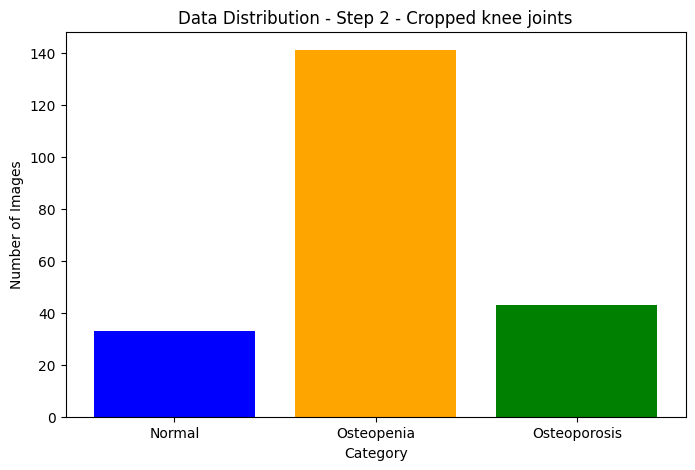

In [22]:
dataset_statistics(output_path_step5, "Step 2 - Cropped knee joints")

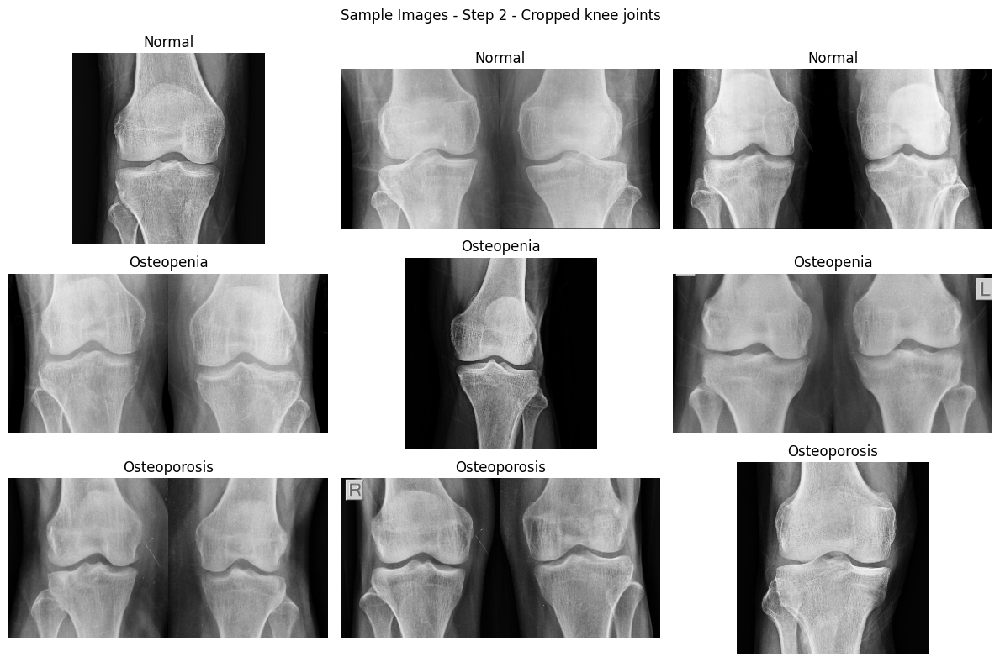

In [28]:
show_sample_images(output_path_step5, "Step 2 - Cropped knee joints")

### Step 3 - Split the dataset into train and validation

In [16]:
import os
import shutil
import random

# Paths
cropped_data_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"
output_train_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_train"
output_val_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_val"

# Create output directories
categories = ["Normal", "Osteopenia", "Osteoporosis"]
for category in categories:
    os.makedirs(os.path.join(output_train_path, category), exist_ok=True)
    os.makedirs(os.path.join(output_val_path, category), exist_ok=True)

# Split ratio
train_ratio = 0.8  # 80% training, 20% validation

def split_data(input_path, train_path, val_path, train_ratio=0.8):
    """Splits images into training and validation sets while preserving class balance."""
    for category in categories:
        category_path = os.path.join(input_path, category)
        images = [img for img in os.listdir(category_path) if img.lower().endswith((".png", ".jpg", ".jpeg"))]
        
        # Shuffle and split data
        random.shuffle(images)
        split_idx = int(len(images) * train_ratio)
        train_images, val_images = images[:split_idx], images[split_idx:]

        # Move images to respective folders
        for img in train_images:
            shutil.copy(os.path.join(category_path, img), os.path.join(train_path, category, img))
        
        for img in val_images:
            shutil.copy(os.path.join(category_path, img), os.path.join(val_path, category, img))

        print(f"📂 {category}: {len(train_images)} training, {len(val_images)} validation images.")

# Run data splitting
split_data(cropped_data_path, output_train_path, output_val_path)

print("\n✅ Step 3 Complete: Data successfully split into training and validation sets.")

📂 Normal: 205 training, 52 validation images.
📂 Osteopenia: 228 training, 57 validation images.
📂 Osteoporosis: 136 training, 34 validation images.

✅ Step 3 Complete: Data successfully split into training and validation sets.


### Step 4 - Knee joint Augmentation on trainind dataset only

Applies 5 different augmentations, each labeled with its type:

1.	Rotation (±15°)
2.	Horizontal Flip
3.	Brightness & Contrast Adjustment
4.	Affine Transformations (Shift & Scale)
5.	Gaussian Blur

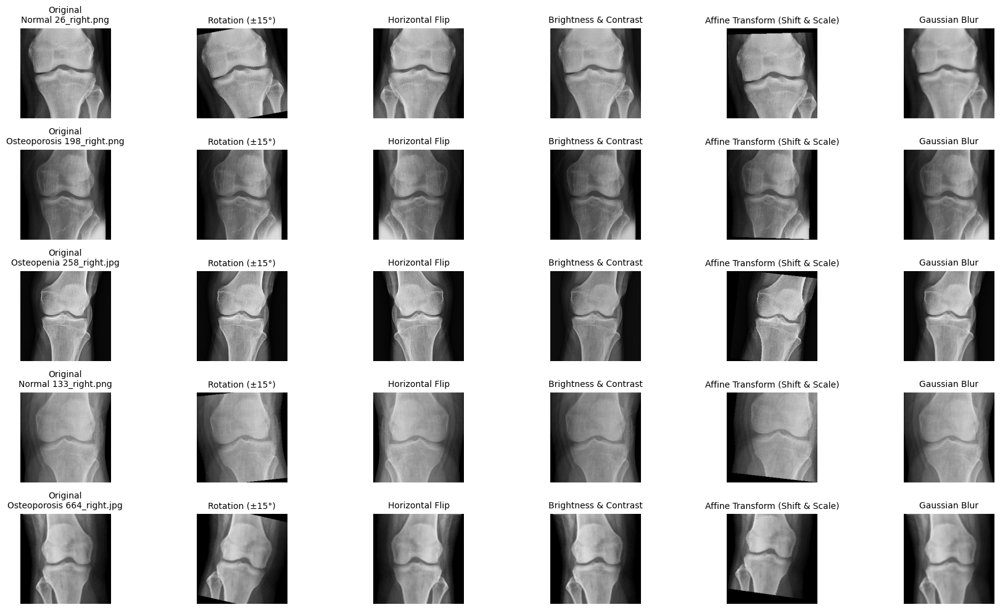

In [17]:
import random
import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from PIL import Image

# Path to Step 2 dataset
step2_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_square_adaptive_knee"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms with labels
augmentation_transforms = [
    ("Rotation (±15°)", transforms.RandomRotation(degrees=15)),
    ("Horizontal Flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("Brightness & Contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("Affine Transform (Shift & Scale)", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("Gaussian Blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Select 5 random images
selected_images = []
for category in categories:
    category_path = os.path.join(step2_path, category)
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    selected_images.extend(random.sample(image_paths, min(2, len(image_paths))))  # Select up to 2 per category

selected_images = random.sample(selected_images, min(5, len(selected_images)))  # Take only 5 total

# Apply augmentations and display
fig, axes = plt.subplots(len(selected_images), 6, figsize=(18, 10))

for i, img_path in enumerate(selected_images):
    img = Image.open(img_path).convert("RGB")
    
    # Show original image
    axes[i, 0].imshow(img, cmap="gray")
    axes[i, 0].set_title(f"Original\n{os.path.basename(img_path)}", fontsize=10)
    axes[i, 0].axis("off")

    # Apply augmentations
    for j, (aug_name, transform) in enumerate(augmentation_transforms):
        augmented_img = transform(img)
        axes[i, j + 1].imshow(augmented_img, cmap="gray")
        axes[i, j + 1].set_title(f"{aug_name}", fontsize=10)  # Show augmentation type
        axes[i, j + 1].axis("off")

plt.tight_layout()
plt.show()

#### Data Augmentation

In [18]:
import os
import random
import glob
from PIL import Image
import torchvision.transforms as transforms
from tqdm import tqdm

# Paths
input_path_step3 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_3_split_train"
output_path_step4 = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_train_augmented"

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Define augmentation transforms
augmentation_transforms = [
    ("rotation", transforms.RandomRotation(degrees=15)),
    ("flip", transforms.RandomHorizontalFlip(p=1.0)),
    ("brightness_contrast", transforms.ColorJitter(brightness=0.2, contrast=0.2)),
    ("affine", transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))),
    ("gaussian_blur", transforms.GaussianBlur(kernel_size=(5, 5), sigma=(0.1, 2.0)))
]

# Create output directory structure
for category in categories:
    os.makedirs(os.path.join(output_path_step4, category), exist_ok=True)

# Process images
for category in categories:
    category_path = os.path.join(input_path_step3, category)
    output_category_path = os.path.join(output_path_step4, category)
    
    image_paths = glob.glob(os.path.join(category_path, "*.jpg")) + glob.glob(os.path.join(category_path, "*.png"))
    
    for img_path in tqdm(image_paths, desc=f"Augmenting {category}"):
        img = Image.open(img_path).convert("RGB")  # Ensure RGB mode
        
        # Save the original image as well
        img.save(os.path.join(output_category_path, os.path.basename(img_path)))
        
        # Apply each augmentation
        for aug_name, transform in augmentation_transforms:
            augmented_img = transform(img)
            new_filename = f"{os.path.splitext(os.path.basename(img_path))[0]}_{aug_name}.jpg"
            augmented_img.save(os.path.join(output_category_path, new_filename))

print("\n✅ Step 3 Complete: Augmented images saved.")

Augmenting Osteoporosis: 100%|██████████| 168/168 [00:01<00:00, 121.17it/s]


✅ Step 3 Complete: Augmented images saved.



📊 **Dataset Statistics After Step 4 - Augmented train knee joints:**
  📂 Normal: 1224 images
  📂 Osteopenia: 1392 images
  📂 Osteoporosis: 816 images


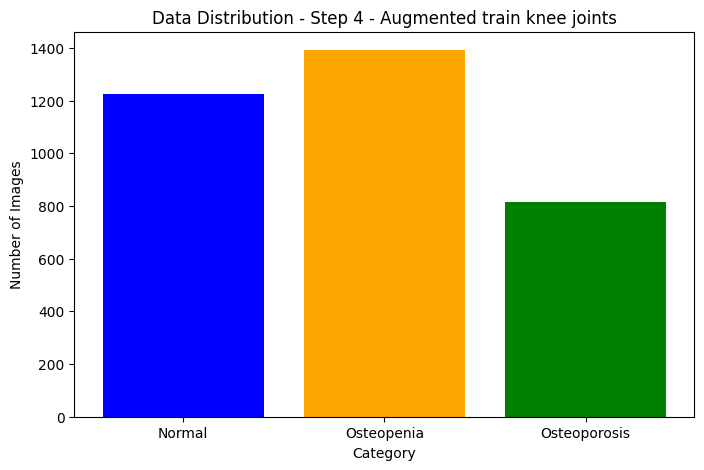

: 

In [ ]:
dataset_statistics(output_path_step4, "Step 4 - Augmented train knee joints")

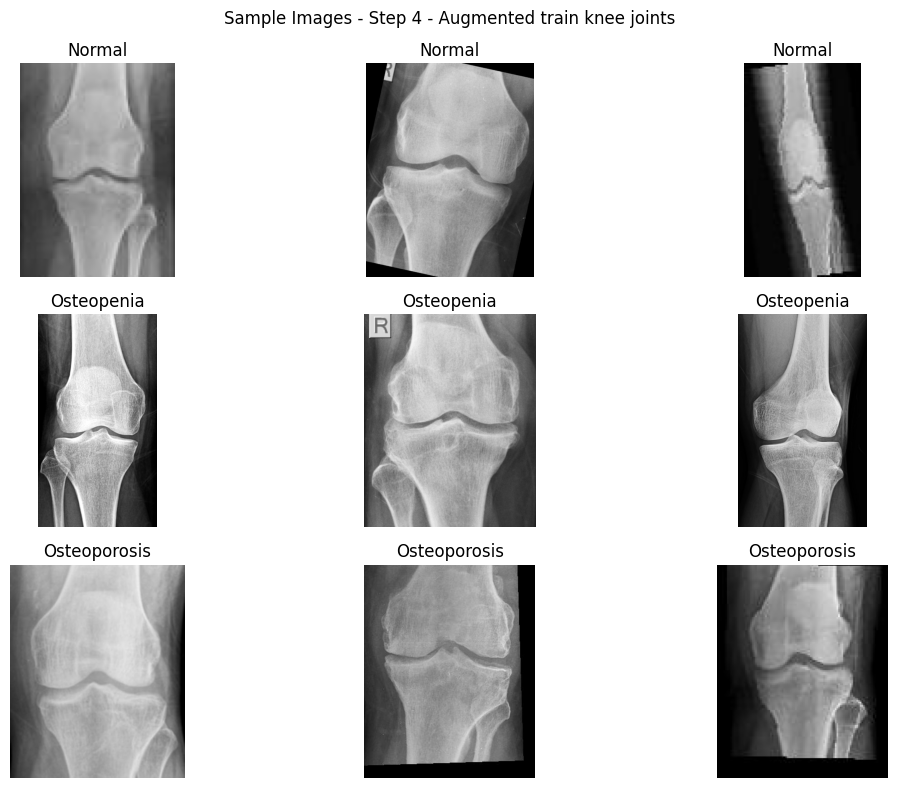

: 

In [ ]:
show_sample_images(output_path_step4, "Step 4 - Augmented train knee joints")

### Step 5 - Enhence Xray images

#### Applies four enhancement techniques:

1. CLAHE (Contrast Enhancement): Enhances bone visibility in low-contrast X-rays.
2. Unsharp Masking (Sharpening): Enhances edges and details in the X-ray.
3. Edge Detection (Canny): Highlights bone structures.
4. Pseudo-Color Mapping: Uses a color map to highlight different intensity areas.


Processing 2 images from category: Normal


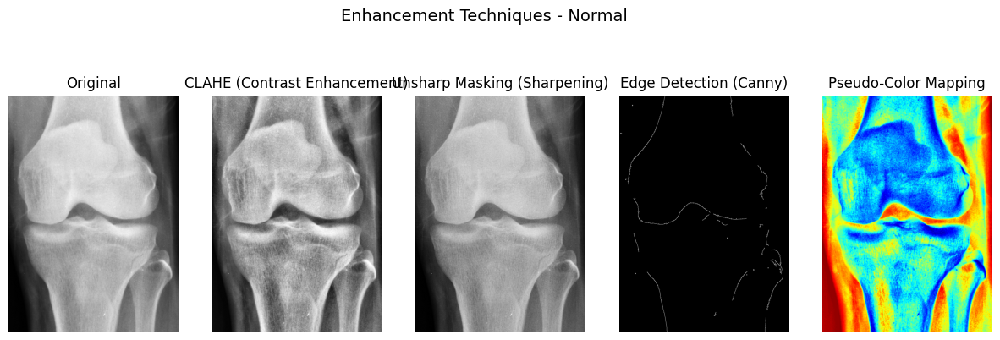

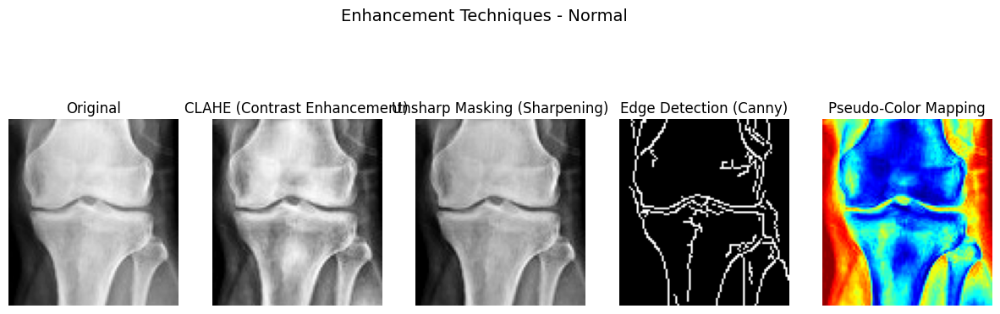


Processing 2 images from category: Osteopenia


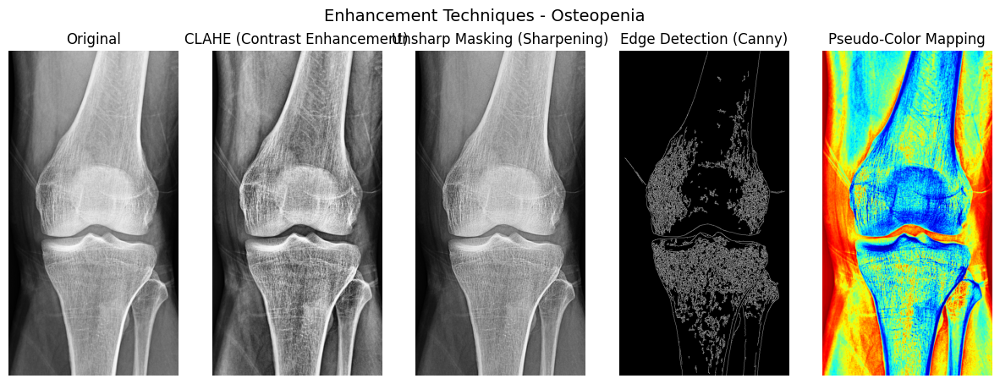

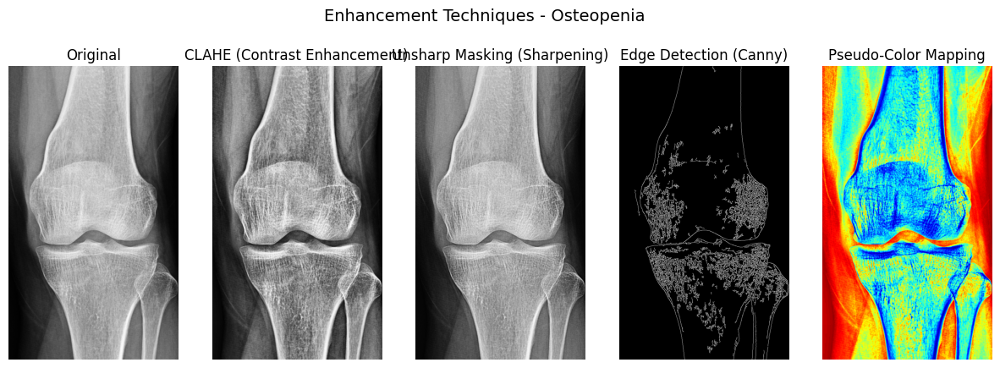


Processing 2 images from category: Osteoporosis


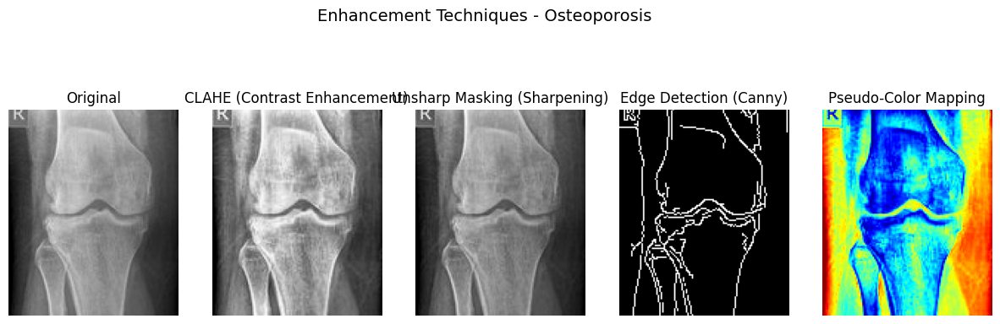

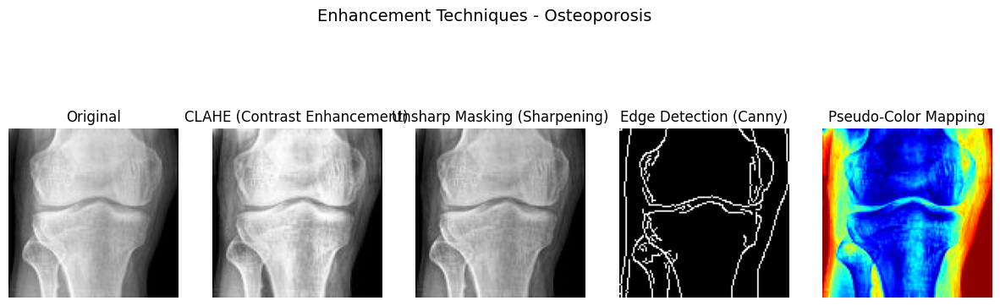

: 

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques ###
def process_multiple_images(base_path, categories, num_images=1):
    for category in categories:
        category_path = os.path.join(base_path, category)

        # Ensure the folder exists and contains images
        if not os.path.exists(category_path) or not os.listdir(category_path):
            print(f"No images found in {category_path}. Skipping...")
            continue

        # Get all image files in the category
        image_files = [
            os.path.join(category_path, f)
            for f in os.listdir(category_path)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        # Randomly select images to process
        selected_images = random.sample(image_files, min(num_images, len(image_files)))

        print(f"\nProcessing {len(selected_images)} images from category: {category}")

        # Process each selected image
        for image_path in selected_images:
            img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Error loading image: {image_path}")
                continue
            
            # Apply transformations
            clahe_img = apply_clahe(img)
            sharpened_img = apply_unsharp_mask(img)
            edges_img = apply_edge_detection(img)
            pseudo_color_img = apply_pseudo_color(clahe_img)

            # Plot results
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            fig.suptitle(f"Enhancement Techniques - {category}", fontsize=14)

            axes[0].imshow(img, cmap="gray")
            axes[0].set_title("Original")
            axes[0].axis("off")

            axes[1].imshow(clahe_img, cmap="gray")
            axes[1].set_title("CLAHE (Contrast Enhancement)")
            axes[1].axis("off")

            axes[2].imshow(sharpened_img, cmap="gray")
            axes[2].set_title("Unsharp Masking (Sharpening)")
            axes[2].axis("off")

            axes[3].imshow(edges_img, cmap="gray")
            axes[3].set_title("Edge Detection (Canny)")
            axes[3].axis("off")

            axes[4].imshow(pseudo_color_img)
            axes[4].set_title("Pseudo-Color Mapping")
            axes[4].axis("off")

            plt.show()

# Run the function
process_multiple_images(base_path, categories, num_images=2)

#### Introducing a problem

variation in image quality (resolution, sharpness, contrast, and noise levels) can lead to misleading classification results. If normal X-rays are of high quality and osteoporosis X-rays are blurry or low-resolution, the model might misinterpret sharp details in normal images as abnormalities, and miss osteoporosis signs in poor-quality images.

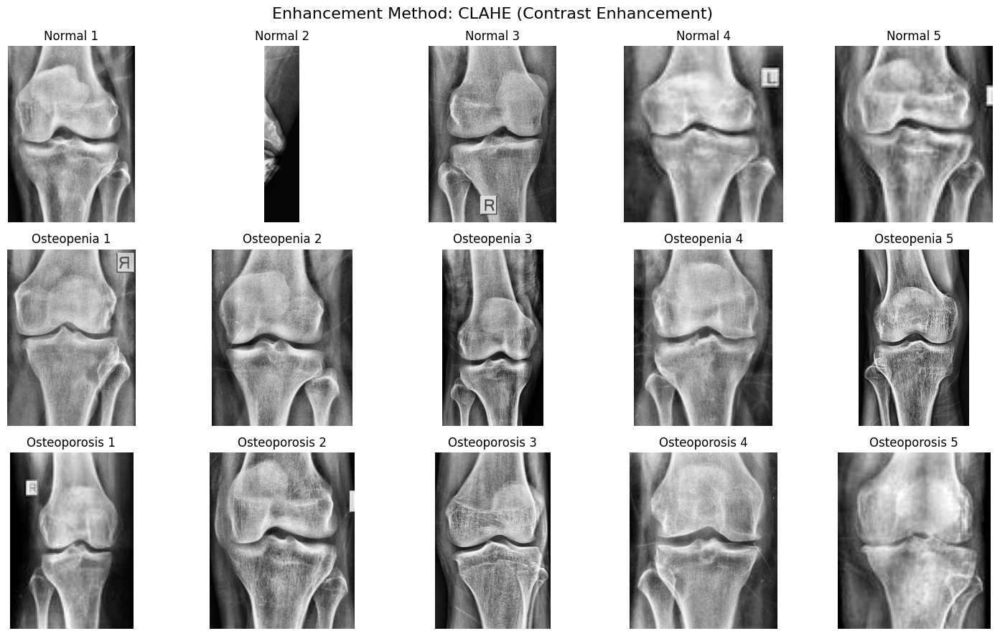

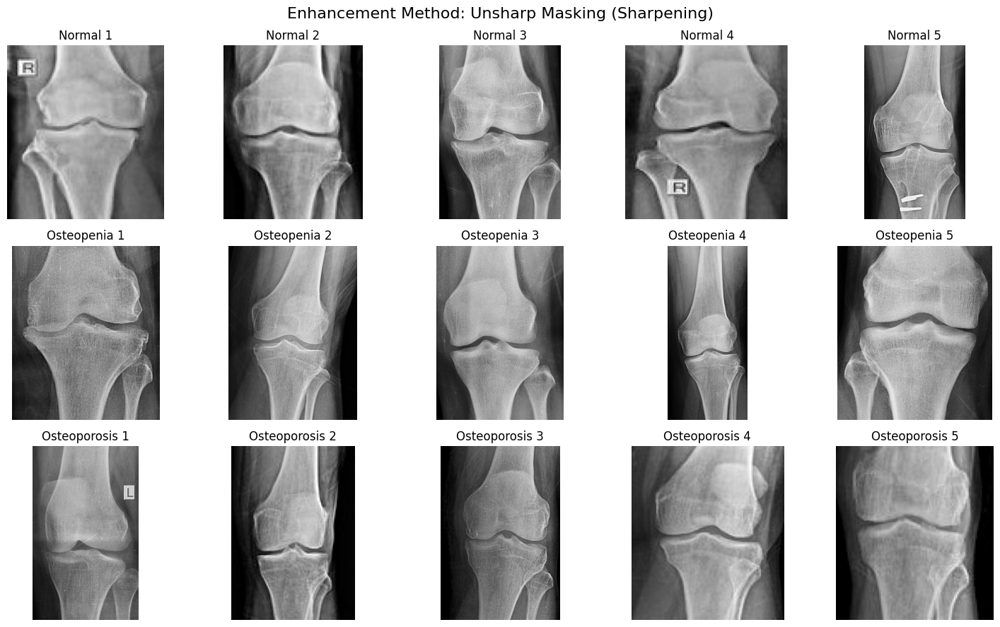

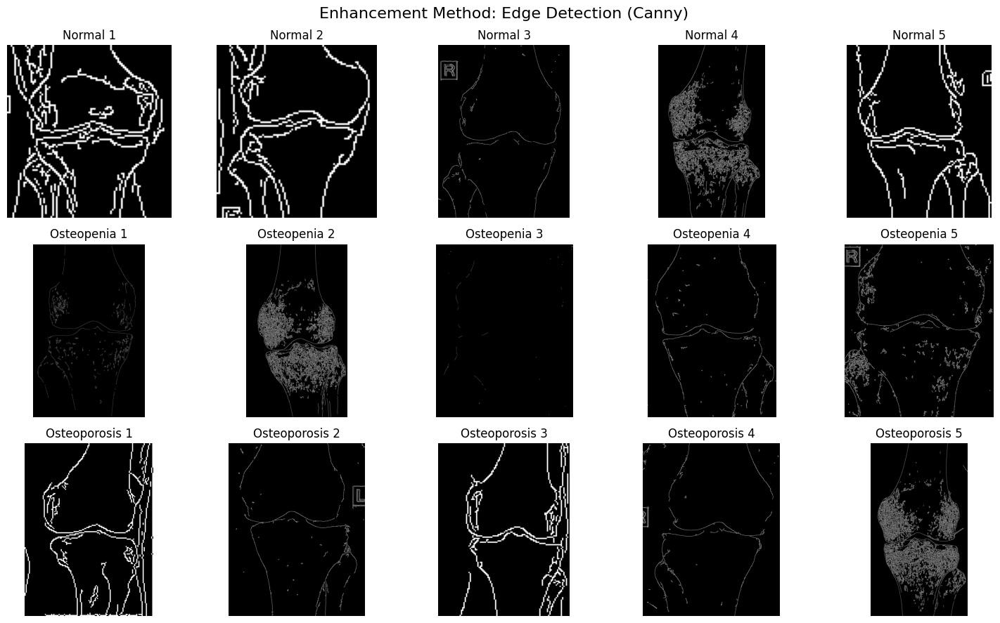

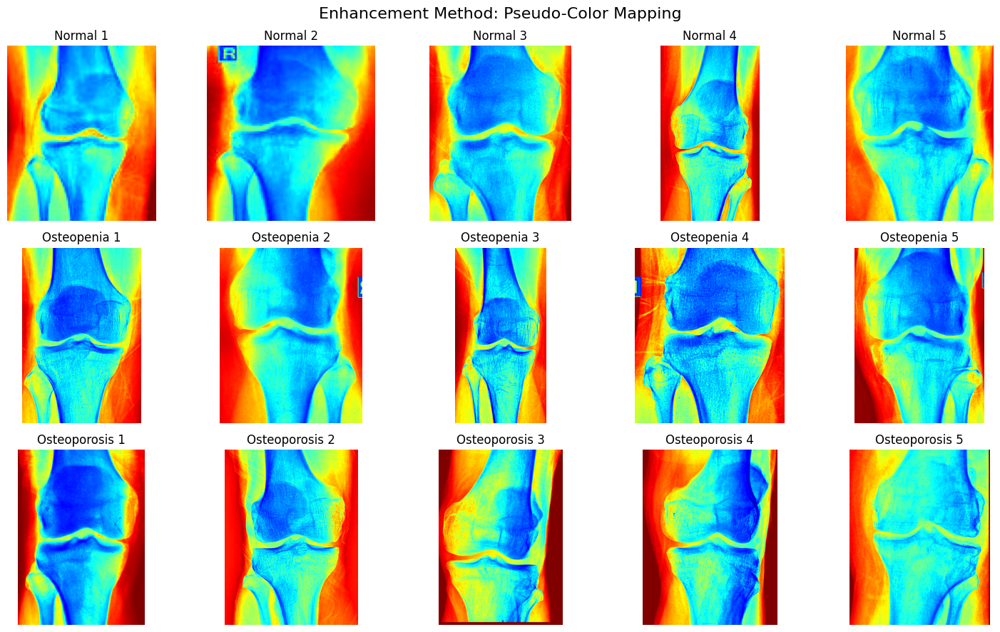

In [19]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define the folder path for Step 2 Cropped Data
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_2_cropped_knee"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

### Enhancement Functions ###
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_unsharp_mask(image):
    """Apply Unsharp Masking for sharpening"""
    blurred = cv2.GaussianBlur(image, (9, 9), 10.0)
    sharpened = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)
    return sharpened

def apply_edge_detection(image):
    """Apply Canny Edge Detection"""
    return cv2.Canny(image, 50, 150)

def apply_pseudo_color(image):
    """Apply Pseudo-Color Mapping"""
    return cv2.applyColorMap(cv2.convertScaleAbs(image), cv2.COLORMAP_JET)

### Process and Visualize Enhancement Techniques by Filter ###
def process_images_by_filter(base_path, categories, num_images=5):
    # Enhancement methods and their functions
    enhancement_methods = {
        "CLAHE (Contrast Enhancement)": apply_clahe,
        "Unsharp Masking (Sharpening)": apply_unsharp_mask,
        "Edge Detection (Canny)": apply_edge_detection,
        "Pseudo-Color Mapping": apply_pseudo_color,
    }

    # Iterate over each enhancement method
    for method_name, method_function in enhancement_methods.items():
        fig, axes = plt.subplots(len(categories), num_images, figsize=(15, 9))
        fig.suptitle(f"Enhancement Method: {method_name}", fontsize=16)

        for row_idx, category in enumerate(categories):
            category_path = os.path.join(base_path, category)

            # Ensure the folder exists and contains images
            if not os.path.exists(category_path) or not os.listdir(category_path):
                print(f"No images found in {category_path}. Skipping...")
                continue

            # Get all image files in the category
            image_files = [
                os.path.join(category_path, f)
                for f in os.listdir(category_path)
                if f.lower().endswith((".png", ".jpg", ".jpeg"))
            ]

            # Randomly select images to process
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Process each selected image
            for col_idx, image_path in enumerate(selected_images):
                img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading image: {image_path}")
                    continue
                
                # Apply enhancement method
                enhanced_img = method_function(img)

                # Plot result
                axes[row_idx, col_idx].imshow(enhanced_img, cmap="gray" if method_name != "Pseudo-Color Mapping" else None)
                axes[row_idx, col_idx].set_title(f"{category} {col_idx+1}")
                axes[row_idx, col_idx].axis("off")

        plt.tight_layout()
        plt.show()

# Run the function
process_images_by_filter(base_path, categories, num_images=5)

#### Apply CLAHE and Save to the New Folder Structure

In [ ]:
import os
import cv2
import shutil
import numpy as np
from tqdm import tqdm

# Define paths
input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_4_train_augmented"
output_base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_5_enhanced_train_xrays"
output_clahe_path = os.path.join(output_base_path, "CLAHE")

# Categories
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Ensure directory structure
for category in categories:
    os.makedirs(os.path.join(output_clahe_path, category), exist_ok=True)

# Apply CLAHE function
def apply_clahe(image):
    """Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)"""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

# Process images
def enhance_images_with_clahe(input_path, output_path):
    """Applies CLAHE enhancement to all images in the dataset"""
    for category in categories:
        category_path = os.path.join(input_path, category)
        output_category_path = os.path.join(output_path, category)

        # Process each image
        for img_name in tqdm(os.listdir(category_path), desc=f"Applying CLAHE to {category}"):
            img_path = os.path.join(category_path, img_name)

            try:
                # Read and process image
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Error loading {img_path}")
                    continue

                # Apply CLAHE
                enhanced_img = apply_clahe(img)

                # Save to new folder
                output_file_path = os.path.join(output_category_path, img_name)
                cv2.imwrite(output_file_path, enhanced_img)
            except Exception as e:
                print(f"Error processing {img_name}: {e}")

    print(f"\n✅ CLAHE enhancement completed! Images saved in: {output_path}")

# Run the CLAHE enhancement process
enhance_images_with_clahe(input_path, output_clahe_path)

Applying CLAHE to Osteoporosis: 100%|██████████| 1008/1008 [00:00<00:00, 1201.33it/s]


✅ CLAHE enhancement completed! Images saved in: /Users/gideonbonwitt/Documents/Msc/Final Project/datasets/training_validation_datasets/step_5_enhanced_train_xrays/CLAHE


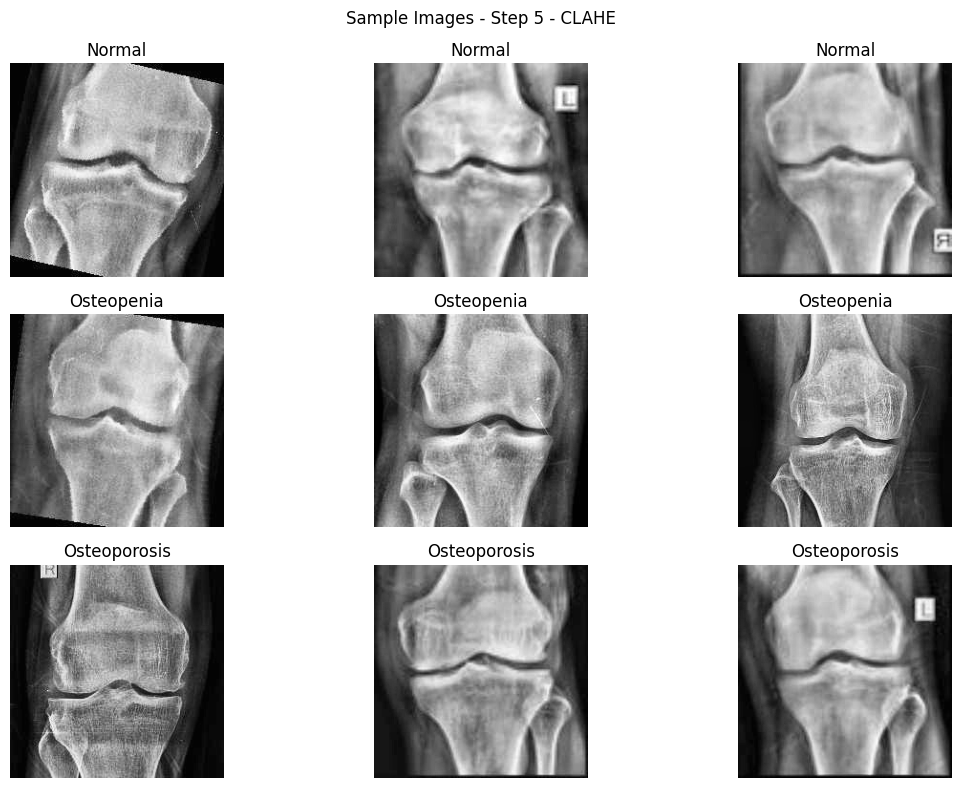


📊 **Dataset Statistics After Step 5 - CLAHE:**
  📂 Normal: 1530 images
  📂 Osteopenia: 1722 images
  📂 Osteoporosis: 1008 images


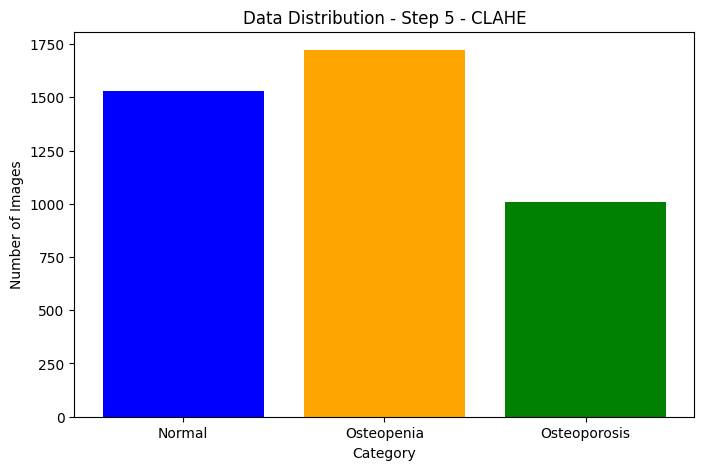

In [22]:
show_sample_images(output_clahe_path, "Step 5 - CLAHE")
dataset_statistics(output_clahe_path, "Step 5 - CLAHE")

# Before applying any filter we need to think what to do with the  different resolution

### Second dataset -  Test Dataset Distribution Before Preprocessing

In [ ]:
# Paths
test_input_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"
test_output_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/test_metabolic_dataset"

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)


📊 **Dataset Statistics After Test dataset:**
  📂 Normal: 36 images
  📂 Osteopenia: 154 images
  📂 Osteoporosis: 49 images


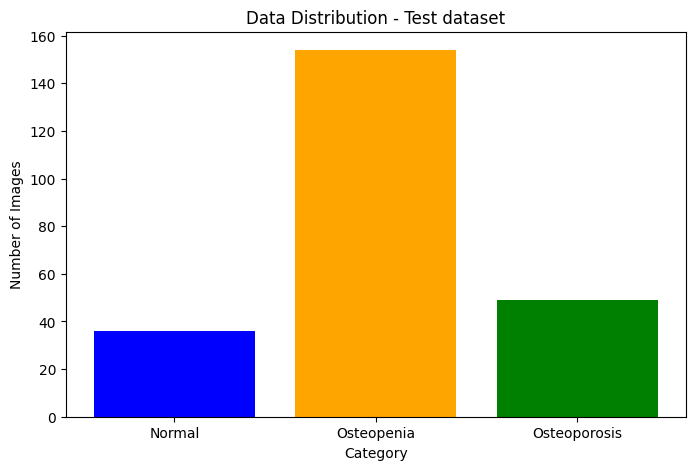

In [ ]:
dataset_statistics(test_input_path, "Test dataset")

Category-wise Statistics:
Category: Normal
  Duplicates: 3
  Unique Images: 33
Category: Osteopenia
  Duplicates: 13
  Unique Images: 141
Category: Osteoporosis
  Duplicates: 6
  Unique Images: 43

Duplicate Distribution:
  20 images have 1 duplicates.
  1 images have 2 duplicates.


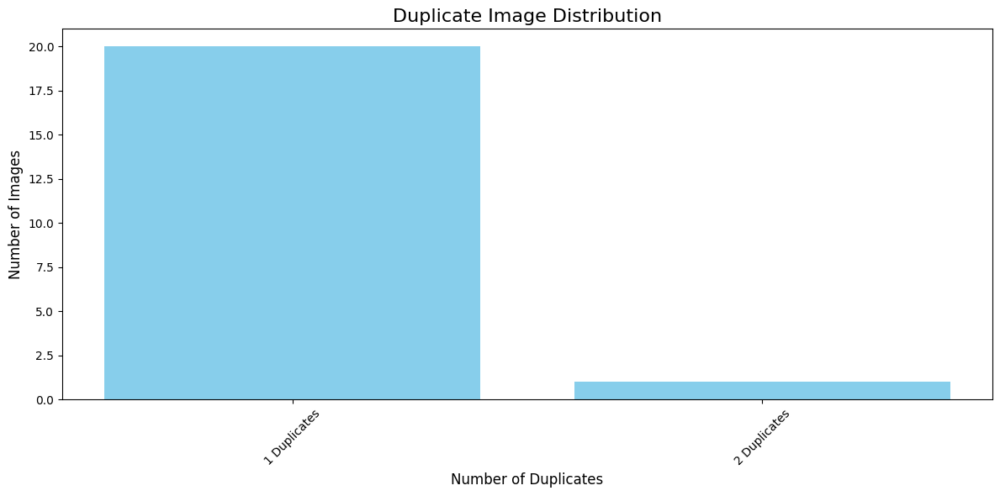


Displaying first 5 duplicate pairs:


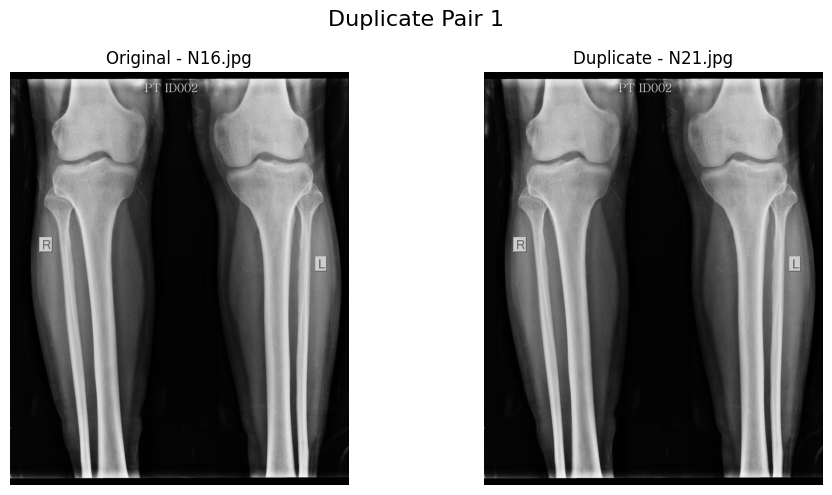

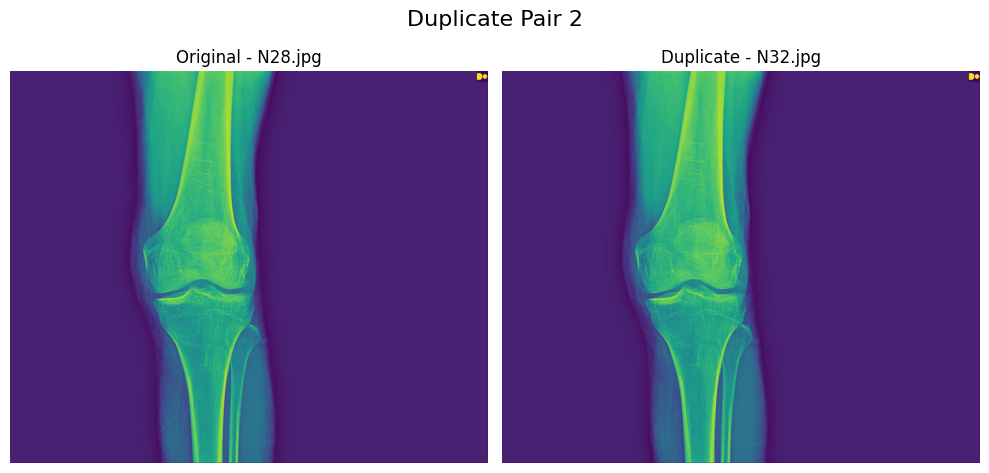

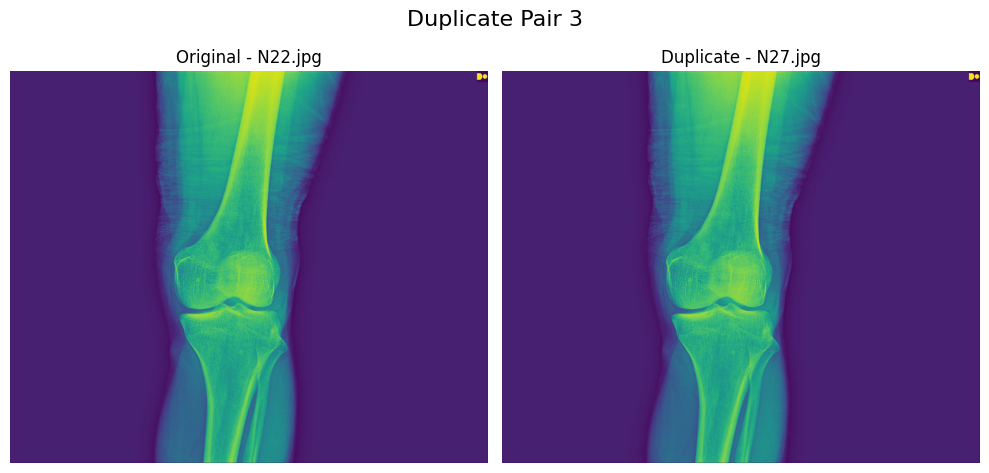

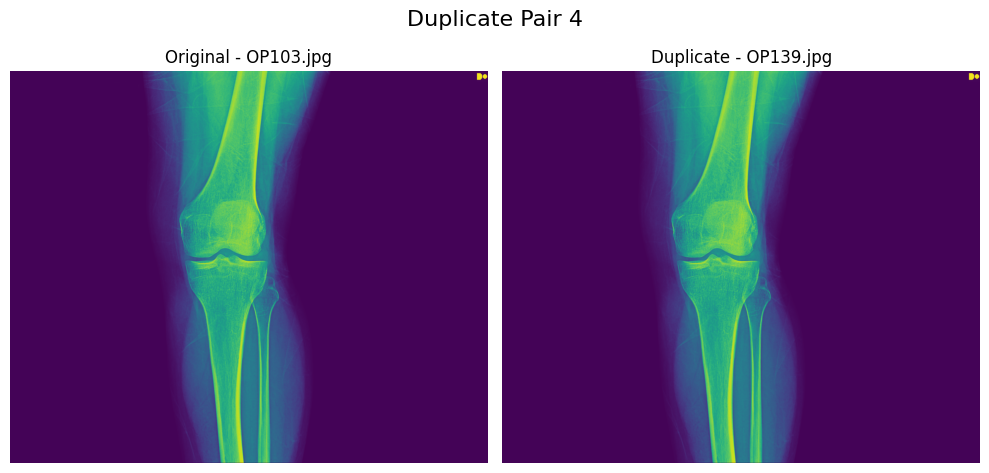

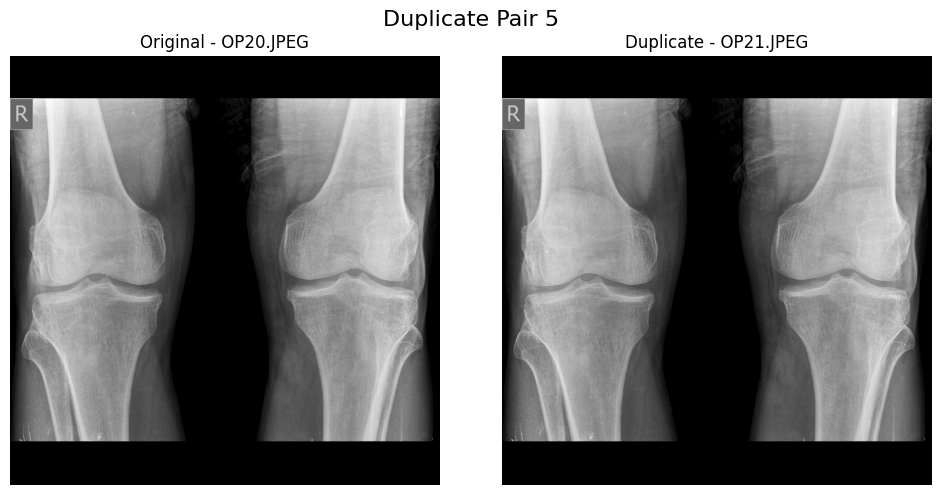

In [ ]:
import imagehash
from PIL import Image
import os
import matplotlib.pyplot as plt
from collections import defaultdict

# Base path to dataset
base_path = "/Users/gideonbonwitt/Documents/Msc/Final Project/datasets/ROOT_DATASETS/Osteoporosis Knee X-ray"

# Categories to process
categories = ["Normal", "Osteopenia", "Osteoporosis"]

# Compute hashes and find duplicates
hashes = {}
duplicates = defaultdict(list)  # Dictionary to store duplicates by their original hash
category_stats = {cls: {"duplicates": 0, "unique": 0} for cls in categories}

for cls in categories:
    folder_path = os.path.join(base_path, cls)
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)
        try:
            img = Image.open(img_path)
            img_hash = imagehash.phash(img)  # Compute perceptual hash
            if img_hash in hashes:
                duplicates[img_hash].append(img_path)  # Group duplicates by hash
                category_stats[cls]["duplicates"] += 1
            else:
                hashes[img_hash] = img_path
                category_stats[cls]["unique"] += 1
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Output the statistics for each category
print("Category-wise Statistics:")
for cls, stats in category_stats.items():
    print(f"Category: {cls}")
    print(f"  Duplicates: {stats['duplicates']}")
    print(f"  Unique Images: {stats['unique']}")

# Analyze duplicate counts for detailed distribution (1, 2, 3, ... duplicates)
duplicate_distribution = defaultdict(int)
for original_img, duplicate_imgs in duplicates.items():
    duplicate_distribution[len(duplicate_imgs)] += 1

# Print duplicate distribution
print("\nDuplicate Distribution:")
for num_duplicates, num_images in sorted(duplicate_distribution.items()):
    print(f"  {num_images} images have {num_duplicates} duplicates.")

# Visualize the distribution as a bar chart
plt.figure(figsize=(12, 6))
plt.bar(
    [f"{k} Duplicates" for k in sorted(duplicate_distribution.keys())],
    [duplicate_distribution[k] for k in sorted(duplicate_distribution.keys())],
    color="skyblue",
)
plt.title("Duplicate Image Distribution", fontsize=16)
plt.ylabel("Number of Images", fontsize=12)
plt.xlabel("Number of Duplicates", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Display the first 5 duplicate pairs
def display_duplicates(duplicate_pairs, max_pairs=5):
    pairs_shown = 0
    for img_hash, dup_list in duplicate_pairs.items():
        if pairs_shown >= max_pairs:
            break
        original_img = hashes[img_hash]
        for duplicate_img in dup_list[:max_pairs]:
            try:
                img1 = Image.open(original_img)
                img2 = Image.open(duplicate_img)
                
                fig, axes = plt.subplots(1, 2, figsize=(10, 5))
                axes[0].imshow(img1)
                axes[0].set_title(f"Original - {os.path.basename(original_img)}")
                axes[0].axis("off")

                axes[1].imshow(img2)
                axes[1].set_title(f"Duplicate - {os.path.basename(duplicate_img)}")
                axes[1].axis("off")

                plt.suptitle(f"Duplicate Pair {pairs_shown + 1}", fontsize=16)
                plt.tight_layout()
                plt.show()
                
                pairs_shown += 1
                if pairs_shown >= max_pairs:
                    break
            except Exception as e:
                print(f"Error displaying duplicate pair: {e}")

# Display first 5 duplicate pairs
print("\nDisplaying first 5 duplicate pairs:")
display_duplicates(duplicates, max_pairs=5)

In [ ]:
analyze_and_remove_duplicates(test_input_path, test_output_path)

Processing Osteoporosis: 100%|██████████████████| 49/49 [00:00<00:00, 64.13it/s]


✅ Step 1 Complete: 22 duplicate images removed.
